## Comentarios del Proyecto

En el primer proyecto, nos fue solicitado crear dos modelos de Machine Learning, uno de vecinos mas cercanos (kNN) y otro de árboles de decisión (DT) para predecir el precio de las propiedades de tipo `Departamento`, `PH` y `Casa` en la Ciudad Autónoma de Buenos Aires (`Capital Federal`).


El dataset consistió en: 

- quedarnos solo con las propeidades de Capital Federal y que sean del tipo Departamento, PH o Casa.
- seleccionar las propiedades cuya superficie total sea menor a 1000 m2 y mayor a 15 m2.
- seleccionar aquellas propiedades cuya precio sea menor 4000000 dólares.
- seleccionas las columnas `rooms`, `bedrooms`, `bathrooms`, `surface_total`, `surface_covered` y `price`.
- descartar aquellas instacias con valores faltantes.

Como solución, mi mejor modelo seleccionado había sido uno de DT de regresión con su hiperparámetro optimizado de profundidad (`max_depth`) en 25. Lo había elegido, ya que, sus valores de MAE (error absoluto medio) habían sido mas bajos al compararlos con el modelo benchmark y el de kNN.

Los errores para el modelos elegido fueron: 

- Error absoluto promedio en Train: 23721.712538651478
- Error absoluto promedio en Test: 49747.683732641075

*Este modelo antes mencionado, será mi nuevo modelo benchmark, el cual trataré de mejorar.*

### Inicio del Proyecto 2

- Importo las librerías necesarias para todo el proyecto

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import iqr
import seaborn as sns
import matplotlib.gridspec as gridspec
from sklearn.neighbors import KNeighborsRegressor
from sklearn.impute import KNNImputer
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge, Lasso
from sklearn.pipeline import make_pipeline
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import warnings
import missingno as msno 
from xgboost import plot_importance
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import RandomizedSearchCV
import graphviz
from xgboost import plot_tree
import winsound
from sklearn.compose import make_column_transformer

In [2]:
#Para notificar el final de un proceso (útil para aquellos de larga duración)
duration = 1000  # milliseconds
freq = 440  # Hz

In [3]:
#Elimino los warnings
warnings.filterwarnings("ignore")

In [4]:
#Para ver toda la información sin que se oculten 
#pd.set_option("display.max_rows", None, "display.max_columns", None)

- Cargo el dataset

In [5]:
#Cargo el dataset
df = pd.read_csv("DS_Proyecto_01_Datos_Properati.csv")

- Selección de variables

Para continuar con el problema planteado de predecir el precio de las propiedades de tipo `Departamento`, `PH` y `Casa` en la Ciudad Autónoma de Buenos Aires (`Capital Federal`), haré la selección en el dataset, de acuerdo al tipo de propiedad solicitado y de acuerdo a la ubicación solicitada.

In [6]:
#Filtro por las condiciones solicitadas
df = df.loc[((df['property_type'] == 'Departamento') |
                (df['property_type'] == 'Casa') |
                (df['property_type'] == 'PH')) & 
                (df['l2'] == 'Capital Federal')]
df.shape

(91485, 19)

Debido a que no aportan información manejable (hasta este momento), decidí eliminar las columnas `start_date`,`end_date`, `created_on`, `title`, y `description`.

Además, ya que no hay variación, no consideré a las variables `l1`(país), ya que solo había en Argentina. Lo mismo con `currency`(solo dólares), `operation_type`(solo ventas) y `l2` (Capital Federal). 

In [7]:
#Coeficiente de correlación de Pearson sin diferenciar por tipo de propiedad
df.corr() #Por default method = 'pearson'

,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
lat,1.000000,-0.063281,0.002065,-0.009273,0.097078,-0.002239,0.000296,0.171693
lon,-0.063281,1.000000,0.059762,0.045443,0.079655,0.000084,0.006052,0.156230
rooms,0.002065,0.059762,1.000000,0.927300,0.603174,0.064774,0.066757,0.448318
bedrooms,-0.009273,0.045443,0.927300,1.000000,0.603968,0.064468,0.066174,0.413555
bathrooms,0.097078,0.079655,0.603174,0.603968,1.000000,0.056524,0.058192,0.587724
surface_total,-0.002239,0.000084,0.064774,0.064468,0.056524,1.000000,0.770742,0.049071
surface_covered,0.000296,0.006052,0.066757,0.066174,0.058192,0.770742,1.000000,0.054534
price,0.171693,0.156230,0.448318,0.413555,0.587724,0.049071,0.054534,1.000000


La correlación de `lat` y `lon` es muy baja con todo el resto de las variables. Además, estas mismas variables estarían representadas en la variable `l3` (barrios), es por ello que decido no usarlas en mi dataset final.

In [8]:
df = df.iloc[:, [7,8,9,10,11,12,13,17]] #l3, rooms, bedrooms, bathrooms, surface_total, surface_covered, price, property_tuype
print(df.shape)
print('Las variables del dataframe son:', *df.columns)
#df_ml.head()

(91485, 8)
Las variables del dataframe son: l3 rooms bedrooms bathrooms surface_total surface_covered price property_type


- EDA (análisis exploratorio de datos)

Realizaré una primera exploración de los datos, usando el reporte proporcionado por`ProfileReport`.

In [9]:
# Para crear el reporte
reporte = ProfileReport(df) 
reporte

Del reporte confeccionado a partir del `ProfileReport`, se puede observar que:
- Se está trabajando con 8 variables: l3, rooms, bedrooms, bathrooms, surface_total, surface_covered, price y property_type (además incluye df_index).


- Existen datos faltantes en: baños, superficie total y superficie cubierta.


- No existen filas duplicadas.


- Habitaciones y ambientes se encuentran muy correlacionadas, al igual que superficie total y superficie cubierta.

# PARTE A - Transformación de Datos

**Elige cuáles de las siguientes tareas son apropiadas para su dataset:**

**1.	Detección y eliminación de Outliers**

**2.	Encoding**

**3.	Imputación de valores faltantes**

**4.	Escalado de datos**

**5.	Generación de nuevas variables predictoras/reducción de dimensionalidad (SVD/PCA).**


- Lo primero que aplicaré es la detección y eliminación de outliers. Decido aplicar esta tarea, ya que al realizar gráficos boxplot, se observan valores fuera de tipo.

- Haré también la tarea de imputar datos faltantes, ya que, 3 de las variables (baños, superficie total y superficie cubierta) poseen datos faltantes. Además, el porcentaje de los mismos supera minímamente el 10% en cada variable.

- También trabajaré con la tarea de encoding, ya que, dos de las variables son de tipo categóricas (barrios y tipo de propiedad). 

- En relación al escalado de datos, es recomendable hacerlo, cuando las unidades de las variables sean distintas. De acuerdo a las variables con las que trabajaré, solo variables numéricas continuas son: precio, superficie total y superficie cubierta. Por lo tanto, la decisión de escalar o no, la iré tomando y explicando a lo largo del proyecto, de acuerdo a las variables con las que esté trabajando. 

 - Evaluación de outliers  

Voy a realizar gráficos boxplot para todas las variables numéricas, para poder visualizar valores outliers.

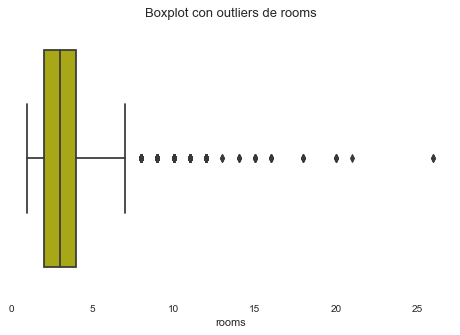

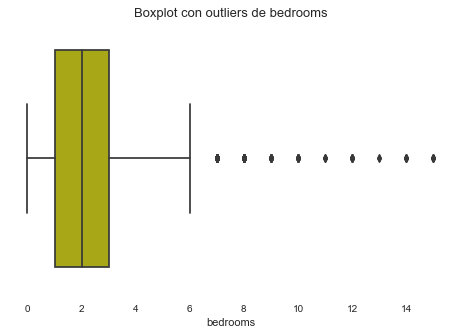

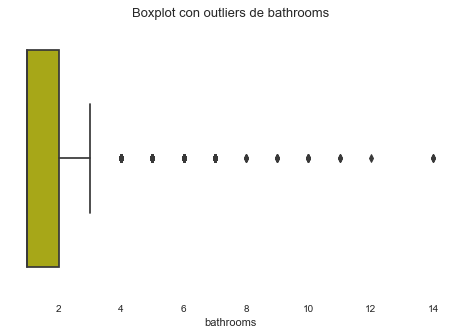

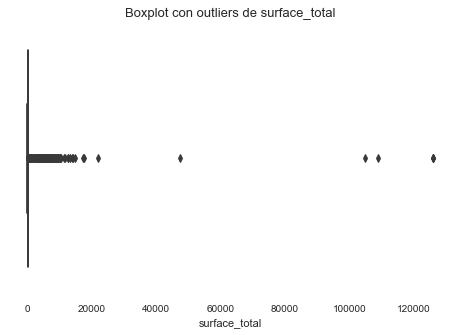

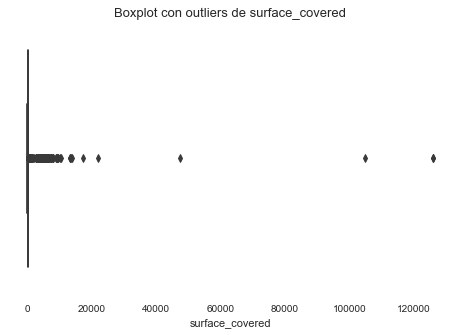

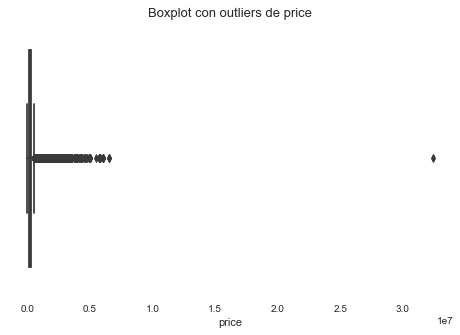

In [10]:
#Para graficar los boxplot de todas las 'columnas'
columnas = ['rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered', 'price']
for col in columnas:
    plt.figure(figsize=(8, 5))
    sns.boxplot(df[col], color = 'y')
    plt.title('Boxplot con outliers de ' + col, fontsize=13)
    plt.show()

**NOTA:** La eliminación de los valores atípicos, la realizaré no discrimando de acuerdo al tipo de propiedad, ya que, en el proyecto 1, hice ambas maneras, y los resultados, resultaron ser similares.

Para la determinación de los valores atípicos, usaré el **método de Tukey**.

Es el método más utilizado académicamente por su sencillez y resultados y toma como referencia la diferencia entre el primer cuartil (Q1) y el tercer cuartil (Q3), o rango intercuartílico (IQR). 

En un diagrama de caja se considera un valor atípico el que se encuentra 1.5 veces esa distancia de uno de esos cuartiles (atípico leve) o a 3 veces esa distancia (atípico extremo).

Para resolver esta sección, utilizaré 1.5 (atípico leve).

In [11]:
#Función para filtrar valores atípicos 
def IQR_outliers(df, column, ancho_bigote = 1.5):
    
    Q1 = np.nanpercentile(df[column],25)
    Q3 = np.nanpercentile(df[column],75)
    IQR = Q3 - Q1
    df = df[~ ((df[column] < (Q1 - ancho_bigote * IQR)) | 
               (df[column] > (Q3 + ancho_bigote * IQR)))]
    return df

Grafico nuevamente los boxplots para ver como cambiaron las distribuciones, luego de eliminar los valores outliers mediante el IQR.

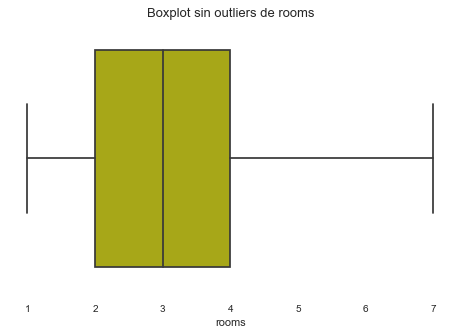

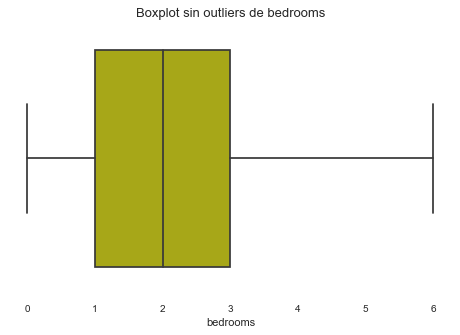

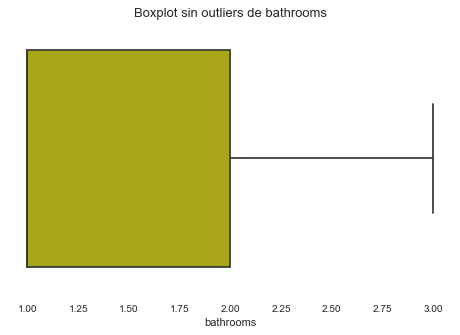

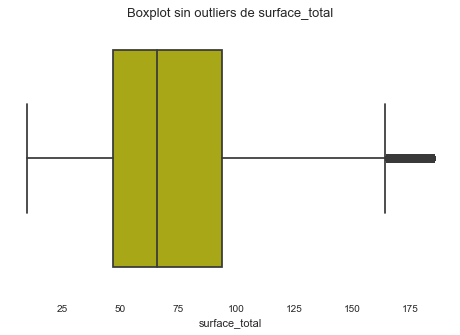

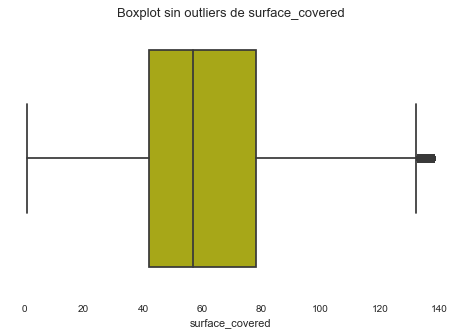

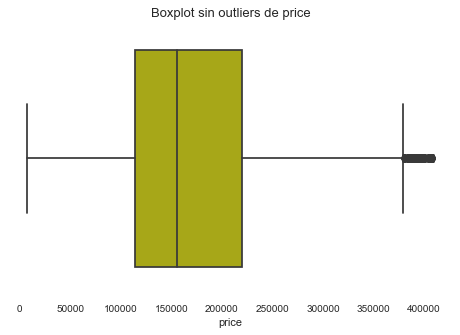

In [12]:
#Para graficar los boxplot de todas las 'columnas'
columnas = ['rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered', 'price']
for col in columnas:
    df = IQR_outliers(df, col, ancho_bigote=1.5)
    plt.figure(figsize=(8, 5))
    sns.boxplot(df[col], color = 'y')
    plt.title('Boxplot sin outliers de ' + col, fontsize=13)
    plt.show()

Como se puede observar en los gráficos boxplot, luego de eliminar los valores atípicos con la metodología propuesta, las varaibles muestran pocos valores atípicos.

In [13]:
# Imprimo la dimensión del dataframe
df.shape

(75495, 8)

- Evaluación de datos faltantes  

A continuación, haré la evaluación de las variables que poseen datos faltantes.

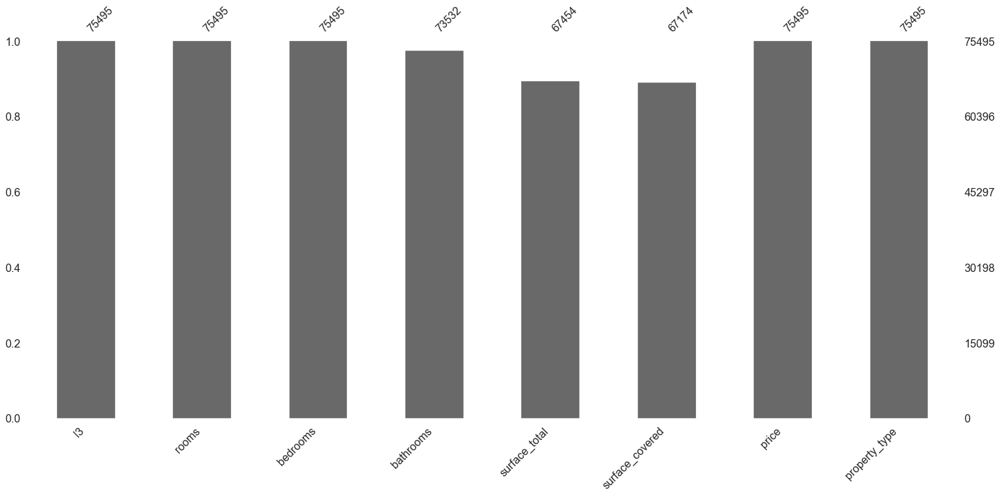

In [14]:
#Gráfico de barras de datos faltantes
msno.bar(df)

Hay valores faltantes para las columnas: baños, superficie total y suerficie cubierta. Voy a evaluar el porcentaje de datos falantes en cada variable.

In [15]:
#Porcentaje de datos faltantes por columnas
df.isnull().sum() * 100 / len(df)

l3                  0.000000
rooms               0.000000
bedrooms            0.000000
bathrooms           2.600172
surface_total      10.651036
surface_covered    11.021922
price               0.000000
property_type       0.000000
dtype: float64

A continuación, observaré de manera gráfica los datos faltantes a través de todas las instancias.

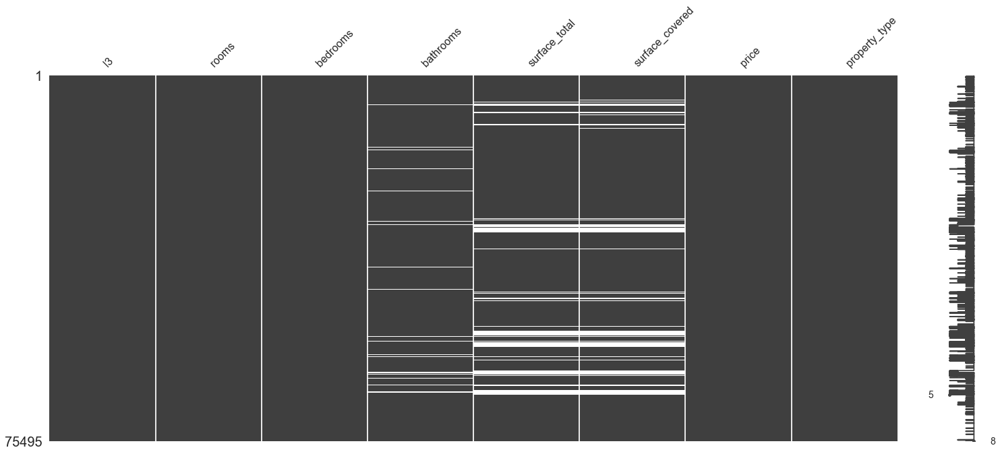

In [16]:
#Matriz de datos faltantes
msno.matrix(df)

Se observa que los valores faltantes en baños, no parecerían depender de ningún patrón, por lo que podríamos sospechar que son MCAR (missing completely at random).

También, se observa que los valores faltantes en superficie total y cubierta se repiten a través de varias de las mismas instancias, por lo que se podría sospechar que son MAR (missing at random).

*Relación de baños con el resto de variables*

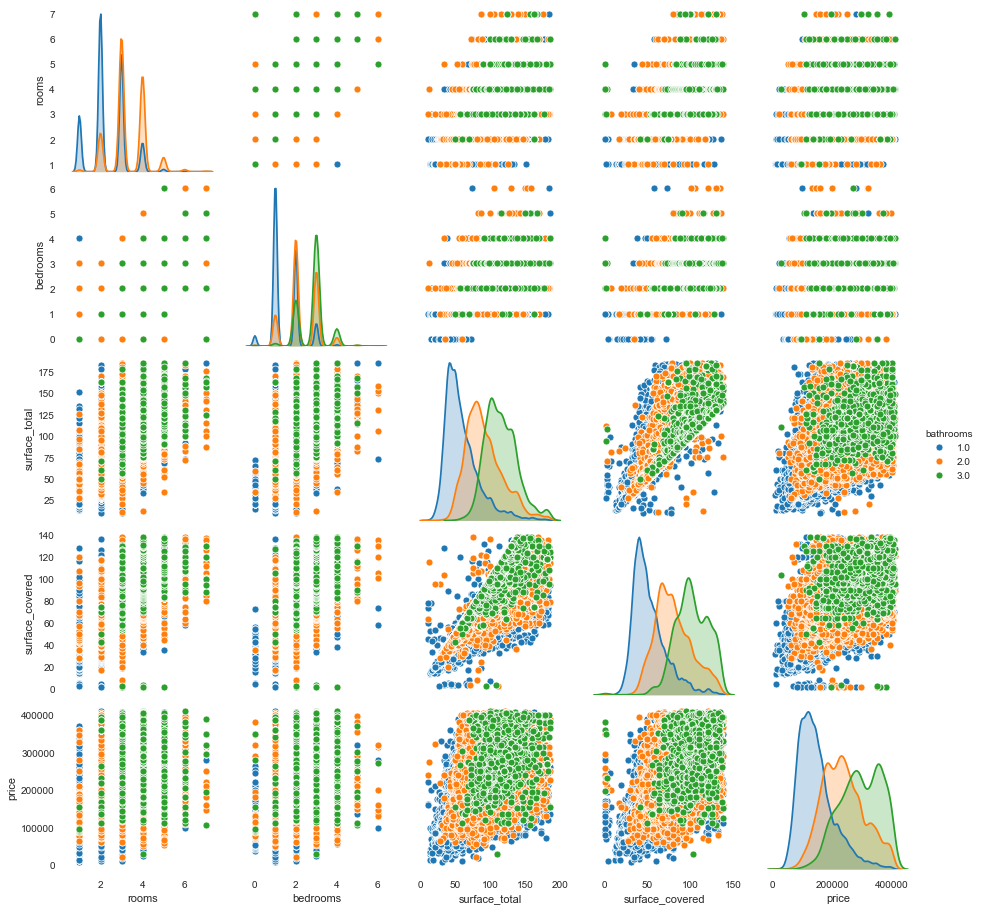

In [17]:
#Pairplot con hue = baños
sns.pairplot(data= df, hue= 'bathrooms')

En el pairplot anterior, se observa como baños muestra relación con superficie cubierta, superficie total y precio. En la diagonal, se observa como superficie total, superficie cubierta y precio, separan claramente las 3 categorías de baños.  

In [18]:
#Correlación
df.corr() #Correlación de Pearson

,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
rooms,1.000000,0.937891,0.490538,0.736510,0.799438,0.587755
bedrooms,0.937891,1.000000,0.489040,0.719739,0.788257,0.568012
bathrooms,0.490538,0.489040,1.000000,0.538711,0.576939,0.575964
surface_total,0.736510,0.719739,0.538711,1.000000,0.902132,0.711798
surface_covered,0.799438,0.788257,0.576939,0.902132,1.000000,0.731814
price,0.587755,0.568012,0.575964,0.711798,0.731814,1.000000


Superficie total y superficie cubierta muestran correlación entre ellas y con precio.

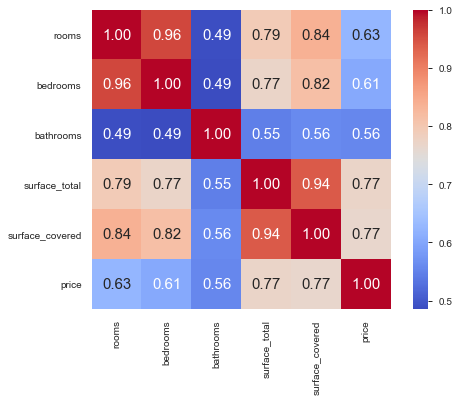

In [19]:
# Gráfico heatmap con correlación, usando Spearman.
corr = df.corr(method = 'spearman')
sns.heatmap(corr, cbar = True,  square = True, annot=True, 
            fmt= '.2f',annot_kws={'size': 15},
            xticklabels= df.drop(columns = ['l3', 'property_type']).columns, 
            yticklabels= df.drop(columns = ['l3', 'property_type']).columns, 
            cmap= 'coolwarm')

También, del heatmap de arriba se puede notar que, superficie total y superficie cubierta muestran relación con ambientes (rooms).

**Superficie total, superficie cubierta y baños:** Aplicaré una imputación con kNNImputer.

Primero utilizaré un kNN con GridSearch para determinar el número de vecinos óptimos a aplicar en el KNNImputer. Para ello, me quedaré con las variables baños, superficie total, superficie cubierta y ambientes SIN los datos faltantes. 

**NOTA:** precio decidí no utilizarla ya que es la variable a predecir en el futuro y no quería que se genere algún tipo de correlación.

Como variables a conformar la `X` utilicé: ambientes, baños y superficie total.

Como variable `y` utilicé a superficie cubierta. 

Superficie cubierta era la que mostraba mayor cantidad de datos faltantes. 

¿Por qué KNNImputer? Lo decidí usar, ya que es un estimador multivariado (a diferencia de SimpleImputer que es un estimador univariado), y como demostré anteriormente, hay relaciones entre varias variables.

**kNN con GridSearch para determinar el número de vecinos a utilizar en el kNNImputer**

In [20]:
#Encabezado y dimensión del DataFrame
df.head()
print(df.shape)

(75495, 8)


In [21]:
#Me quedo con las variables de interés
data_sin_nan = df.copy()
data_sin_nan = data_sin_nan.iloc[:,[1,3,4,5]] #ambientes, baños, superficie total, superficie cubierta
#data_sin_nan.head()
print(data_sin_nan.shape)
print(data_sin_nan.columns)

(75495, 4)
Index(['rooms', 'bathrooms', 'surface_total', 'surface_covered'], dtype='object')


In [22]:
#Elimino todos los datos faltantes
data_sin_nan =  data_sin_nan.dropna(axis=0)
data_sin_nan.head()
print(data_sin_nan.shape)

(66296, 4)


In [23]:
#Defino la X e y
X = data_sin_nan.iloc[:, [0,1,2]] #ambientes, baños, superficie total
y = data_sin_nan.iloc[:, [3]] #superficie cubierta

print('Columnas de X:', *X.columns)
print('Columnas de y:', *y.columns)

Columnas de X: rooms bathrooms surface_total
Columnas de y: surface_covered


In [24]:
# Dividimos los datos en Train y Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42) #0.25 default

**NOTA:** Para la elección del tamaño a usar como test_size, decidí elegir 0.10 (10 %). Considero que el número de muestras es grande y un 10 % de las mismas para utlizar como test, es representativo.

In [25]:
#Instancio el modelo
knn = KNeighborsRegressor() 

La grilla para `GridSearch`, solo la armé para optimizar el hiperparámetro número de vecinos, el cual decidí establecerlo entre 1 y 9 vecinos.

In [26]:
# Grilla para Grid Search para buscar el mejor n_neighbors
param_grid = {'n_neighbors':np.arange(1, 10)}

In [27]:
#Instancio el modelo
model = GridSearchCV(knn, param_grid=param_grid, cv=5)

# Entrenamos: KNN con la grilla definida arriba y CV con tamaño de Fold=5
model.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': array([1, 2, 3, 4, 5, 6, 7, 8, 9])})

In [28]:
#Imprimo los mejores parámetros
print("Mejores parametros: "+str(model.best_params_))
print("Mejor Score: "+str(model.best_score_)+'\n')

Mejores parametros: {'n_neighbors': 9}
Mejor Score: 0.8940366980269321



El número de vecinos elegido es 9. El score obtendio es muy bueno. El valor de vecinos lo utilizaré a continuación para realizar el kNNImputer

**KNNImputer**

In [29]:
#Encabezado del DataFrame
df.head()

,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
1,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,PH
5,Villa Crespo,2.0,1.0,1.0,56.0,56.0,150000.0,PH
6,Villa Crespo,2.0,1.0,1.0,70.0,70.0,159500.0,PH


In [30]:
#Defino la X
X = df.iloc[:, [1,3,4,5]] #rooms, baños, superficie total, superficie cuebierta
print('Columnas en X:', *X.columns)

Columnas en X: rooms bathrooms surface_total surface_covered


In [31]:
#Instancio el modelo, y coloco los vecinos selectos del método anterior
imputer = KNNImputer(n_neighbors = 9)

#Hago el entrenamiento y transformación de la X
data_knn_filled = imputer.fit_transform(X)

In [32]:
#Paso a dataframe la imputación
data_knn_filled = pd.DataFrame(data_knn_filled, columns = ['rooms','bathrooms','surface_total','surface_covered'])  
data_knn_filled.shape

(75495, 4)

In [33]:
#Chequeo si existen datos faltantes
data_knn_filled.isna().sum()

rooms              0
bathrooms          0
surface_total      0
surface_covered    0
dtype: int64

Hago un nuevo dataset con la imputación por kNN, para ello elimino las variables con datos faltantes del dataset (df), para reemplazarlas por las nuevas columnas imputadas.

In [34]:
#Restablezco los índices en las filas
df = df.reset_index(drop=True)
#data_final.tail()

In [35]:
#Elimino las columnas no imputadas del dataset
df.drop(['bathrooms','surface_total','surface_covered'], axis=1, inplace=True)

In [36]:
#Agrego la columna imputada de baños al dataset. Aplico redondedo para que el número de baños sea sin decimales
df ['bathrooms'] = data_knn_filled ['bathrooms']
df ['bathrooms'] = round (df ['bathrooms'], 0)

In [37]:
#Agrego la columna imputada de superficie total al dataset.
df ['surface_total'] = data_knn_filled ['surface_total']

In [38]:
#Agrego la columna imputada de superficie cubierta al dataset.
df ['surface_covered'] = data_knn_filled ['surface_covered']

In [39]:
#Chequeo si existen datos faltantes en todo el dataset
df.isna().sum()

l3                 0
rooms              0
bedrooms           0
price              0
property_type      0
bathrooms          0
surface_total      0
surface_covered    0
dtype: int64

In [40]:
#Chequeo el dataset 
print(df.shape)
df.head()

(75495, 8)


,l3,rooms,bedrooms,price,property_type,bathrooms,surface_total,surface_covered
0,Boedo,2.0,1.0,159000.0,PH,2.0,70.0,58.0
1,Palermo,2.0,1.0,125000.0,PH,1.0,45.0,45.0
2,Palermo,2.0,1.0,295000.0,PH,1.0,85.0,50.0
3,Villa Crespo,2.0,1.0,150000.0,PH,1.0,56.0,56.0
4,Villa Crespo,2.0,1.0,159500.0,PH,1.0,70.0,70.0


En el proyecto 1, habíamos visto que había instancias donde la superficie cubierta era mayor a la superficie total. A continuación eliminaré esas instancias. **NOTA:** no consideré modificar estos datos, ya que el porcentaje de los mismos era muy bajo, por lo que no valía la pena modificarlos.

In [41]:
#Calculo del porcentaje de valores donde la superficie cubierta > superficie total
total = df.apply(lambda x: True if x['surface_covered'] > x['surface_total'] else False , axis=1)
num_casos = len(total[total == True].index)
print('Porcentaje de casos donde superficie cubierta > a superficie total: ', round((num_casos/len(df)*100),2))

Porcentaje de casos donde superficie cubierta > a superficie total:  3.38


In [42]:
#Elimino los casos donde la superficie cubierta > superficie total
data_final = df.loc[(df['surface_total'] >= df['surface_covered'])]
data_final = data_final.reset_index(drop=True)
print(data_final.shape)
data_final.tail()

(72943, 8)


,l3,rooms,bedrooms,price,property_type,bathrooms,surface_total,surface_covered
72938,Palermo,2.0,1.0,170000.0,Departamento,1.0,80.0,80.0
72939,Palermo,3.0,2.0,225000.0,Departamento,2.0,85.0,81.0
72940,Palermo,3.0,2.0,399000.0,Departamento,2.0,88.0,82.0
72941,Palermo,3.0,2.0,178000.0,PH,1.0,84.0,84.0
72942,Palermo,5.0,2.0,298000.0,PH,2.0,114.0,95.0


In [43]:
#winsound.Beep(freq, duration)

**NOTA:** La eliminación de las instancias en donde se cumplía la condición anteriormente expuesta, se realizó luego de imputar los datos faltantes, ya que, la comparación de un valor, sea de superficie total o de superficie cubierta, contra un valor NaN, daba como resultado la eliminación de la instancia. Es por ello, que primero realicé la imputación. Además, con la imputación de los datos, podrían existir nuevas instancias con ésta condición.

- Encoding  

**NOTA:** el proceso de encoding, no era necesario para contrastar el modelo elegido en el proyecto 1. Sin embargo, decidí incluirlo en esta parte de pre-procesamiento, para dejar las variables listas, en caso de necesitar usarlas en las siguientes partes.

Para poder incorporar al modelo las variables categóricas, debemos hacerles una transformación. Las variables categóricas son Tipo de propiedad (`property_type`) y Barrios (`l3`).

Al ser variables categóricas nominales (no siguen un orden) utilizaré el método de Pandas **get_dummies**.

In [44]:
#Para saber el número de categorías diferentes por variables categórica
l3_cant = len(set(data_final['l3']))
print('Número de barrios:', l3_cant)

property_type_cant= len(set(data_final['property_type']))
print('Número de tipos de propiedades:', property_type_cant)

Número de barrios: 57
Número de tipos de propiedades: 3


In [45]:
#Aplico get_dummies
data_encoded = pd.get_dummies(data = data_final.copy(),
                          columns = ['l3','property_type'],
                          prefix = ['l3', 'Propiedad'],
                          prefix_sep = '_')
data_encoded.head()

,rooms,bedrooms,price,bathrooms,surface_total,surface_covered,l3_Abasto,l3_Agronomía,l3_Almagro,l3_Balvanera,...,l3_Villa Pueyrredón,l3_Villa Real,l3_Villa Riachuelo,l3_Villa Santa Rita,l3_Villa Soldati,l3_Villa Urquiza,l3_Villa del Parque,Propiedad_Casa,Propiedad_Departamento,Propiedad_PH
0,2.0,1.0,159000.0,2.0,70.0,58.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,2.0,1.0,125000.0,1.0,45.0,45.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,2.0,1.0,295000.0,1.0,85.0,50.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,2.0,1.0,150000.0,1.0,56.0,56.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,2.0,1.0,159500.0,1.0,70.0,70.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [46]:
#Dimensión del DatFrame
data_encoded.shape

(72943, 66)

- Contraste con el modelo del proyecto 1

Como expliqué anteriomente, el modelo que seleccioné como mejor fue un **Árbol de decisión de regresión cuya profundidad estaba optimizado en 25**. Las variables que había utilizado eran: superficie total, superficie cubierta, ambientes, habitaciones, baños y precio. 

Por ello aplicaré el mismo el mismo modelo, pero con el dataset con las moficaciones que sugerí arriba.

In [47]:
#Voy a seleccionar las variables predictoras (X) y la variables a predecir (y)
X = data_final.loc[:,['surface_total','surface_covered','rooms','bedrooms','bathrooms']]
y = data_final.price

In [48]:
#Hago la división de los datos para entrenamiento y testeo
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=1)

In [49]:
#Modelo de Árbol de decisión.
tree_regressor = DecisionTreeRegressor(max_depth = 25, random_state = 1)

#Ajusto (entreno) el modelo
tree_regressor.fit(X_train, y_train)

#Valores predichos
y_train_pred = tree_regressor.predict(X_train)
y_test_pred = tree_regressor.predict(X_test)

Modelo: Árbol de Decisión
Error absoluto promedio en Train: 22459.99660299608
Error absoluto promedio en Test: 28422.725083987236

Raiz del error cuadrático medio en Train: 34891.29522276065
Raiz del error cuadrático medio en Test: 43184.72636533376


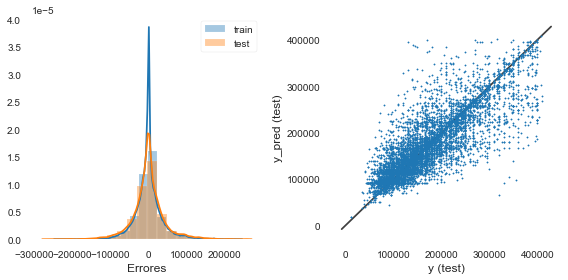

In [50]:
#Grafico los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data
    
print('Modelo: Árbol de Decisión')

mae_train= mean_absolute_error(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
print(f'Error absoluto promedio en Train: {mae_train}')
print(f'Error absoluto promedio en Test: {mae_test}')

rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'\nRaiz del error cuadrático medio en Train: {rmse_train}')
print(f'Raiz del error cuadrático medio en Test: {rmse_test}')
    

plt.figure(figsize = (8,4))

plt.subplot(1,2,1)
sns.distplot(y_train - y_train_pred, bins = 20, label = 'train')
sns.distplot(y_test - y_test_pred, bins = 20, label = 'test')
plt.xlabel('Errores', fontsize = 'large')
plt.legend()


ax = plt.subplot(1,2,2)
ax.scatter(y_test,y_test_pred, s =2)

lims = [
np.min([ax.get_xlim(), ax.get_ylim()]), 
np.max([ax.get_xlim(), ax.get_ylim()]), 
       ]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
plt.xlabel('y (test)', fontsize = 'large')
plt.ylabel('y_pred (test)', fontsize = 'large')

plt.tight_layout()
plt.show()

**Conclusión:** Al aplicar el mismo modelo (DT) seleccionado en el proyecto 1, con la misma profundidad y con las mismas variables, se puede observar que el error (MAE) se ha reducido, tanto en el set de entrenamiento como en el de testeo. Además, la diferencia entre el MAE del train y test se redujo (para el modelo del proyecto 1 esta diferencia era de poco mas de 26000 y para el modelo mejorado en esta sección poco mas de 5900). Si bien, se ha reducido claramente parte del overfitting, el proceso de mejora del modelo deberá seguir.

Para recordar:

- MAE modelo proyecto 1:

Error absoluto promedio en Train: 23721.712538651478

Error absoluto promedio en Test: 49747.683732641075


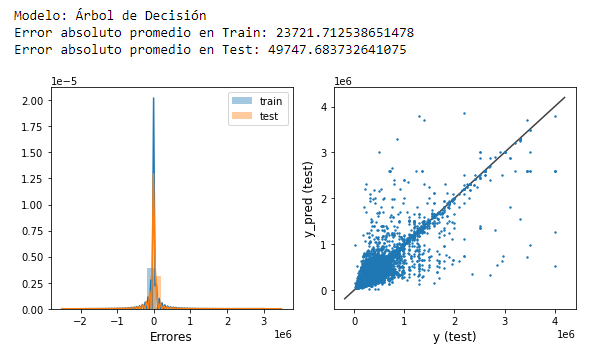

- MAE modelo proyecto 2:

Error absoluto promedio en Train: 22459.99660299608

Error absoluto promedio en Test: 28422.725083987236

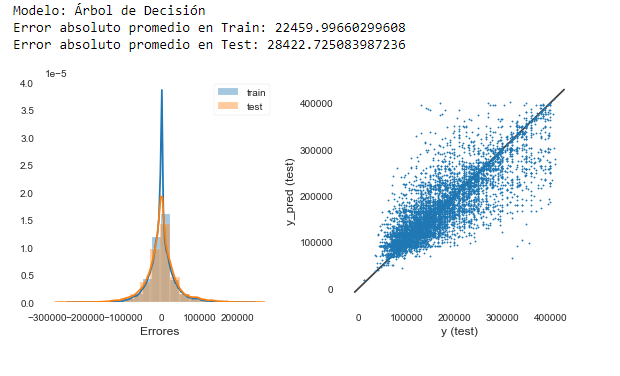



**¿A qué se debe esta mejora?**

Esto se debe a toda la tarea de pre-procesamiento que se le hizo al dataset en esta ocasión. El tener valores outliers, tiene como principal problema, que son elementos que pueden no ser representativos de la población pudiendo distorsionar seriamente el comportamiento. En cuanto a los valores faltantes (NaN), la imputación, permite no 'eliminar' esas instancias y poder tener un dato, a su vez, confiable. Todo este porcesamiento, hace que el dataset sea representativo de nuestra población y mas confiables.

**NOTA:** Respecto al escalado de los datos, las variables posibles a escalar eran superficie total y superficie cubierta. Ambas poseen la misma escala, es por ello que decidí no escalar.

**NOTA 2:** Si bien, realicé el encoding de dos variables (barrios y tipo de propiedad), aún no las utilicé, ya que el objetivo era comparar con el modelo propuesto en el proyecto 1. Sin embargo, lo realicé, para utilizarlo a posterior y ya quedarme con el dataset listo.

# PARTE B - Modelos Avanzados

**6.	Elige dos de los modelos avanzados vistos (en el caso de regresión, considera una regresión lineal con atributos polinómicos y regularización). Entrénalos y evalúalos con sus argumentos por defecto. No te olvides de hacer un train/test split y usar Validación Cruzada**

- Los modelos que utilizaré son: 

**i.** regresión lineal con caracteres polinómicos y 

**ii.** XGBoost

**NOTA:** Métrica para elegir

En el proyecto 1, la métrica elegida fue MAE: en aquel dataset, no se había realizado una evaluación de los outliers, y tal como se veía en los boxplot, existían outliers, por lo tanto ya que el MAE era mas robusto con los outliers (no hace uso de los cuadrados), decidí usar esta métrica.

**En este nuevo proyecto, hice manejo de outliers, por lo que decidí cambiar la métrica a RMSE.**

RMSE: los errores se cuadran antes de promediarlos. Básicamente, esto implica que RMSE asigna un mayor peso a los errores más grandes. Esto indica que RMSE es mucho más útil cuando hay grandes errores y afectan drásticamente el rendimiento del modelo. También en esta métrica, cuanto menor sea el valor, mejor es el rendimiento del modelo.

**NOTA 2:** En esta parte B, decidí incorporar las variables `l3` (barrios) y `property_type` (tipo de propiedad), aprovechando que en la transformación de datos pude realizar el encoding de las mismas. Además, en el proyecto 1, había concluído que tal vez el modelo podría mejorar al utilizar estas variables.

**i. Regresión polinómica con valores por default y cross validation**

In [51]:
#Defino el dataset
data_rlp = data_encoded.copy()
data_rlp.tail()
data_rlp.shape

(72943, 66)

In [52]:
#Resumen conciso del dataframe
#data_rlp.info()

In [53]:
#Defino la X y la y
X = data_rlp.iloc[:, np.r_[0,1,3:66]] #todas las variables menos 'price' 
y = data_rlp.iloc[:, [2]] #price

In [54]:
#Defino el train/test/split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

In [55]:
#pd.set_option("display.max_columns", None)

In [56]:
#X_train.head()

**NOTA:** Para desarrollar este modelo, las variables con posibilidad de escalado son superficie total y superficie cubierta, ambas con la misma escala, por lo que no realizaré escalado.

A continuación, incoporporaré atributos polinómicos a través del **Polynomialfeatures**. Esto lo haré usando sus valores por default.

La incorporación de atributos polinómicos lo hice sólo en las variables que no habían sido 'encodeadeas', es decir, sólo en  ambientes, baños, habitaciones, superficie total y superficie cubierta. Esto lo realizé utilizando **make_column_transformer**, la cual construye un ColumnTransformer a partir de los transformadores dados. 

In [57]:
#Instancio el modelo de regresión lineal
reg_lin = LinearRegression()    

#Aplico los atributos polinómicos a las columnas selectas
columns = ["rooms", "bedrooms", "bathrooms", "surface_total", "surface_covered"]
reg_poly = make_column_transformer((PolynomialFeatures(include_bias=False), columns), remainder= 'passthrough')  
                         
#Defino la nueva X_train y X_test                                
X_train_new = reg_poly.fit_transform(X_train)                            
X_test_new = reg_poly.transform(X_test)

In [58]:
#Entreno el modelo de regresión
reg_lin.fit(X_train_new, y_train)

LinearRegression()

In [59]:
#Cross Validation

cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)

cv_results = abs(cross_val_score(reg_lin, X_train_new, y_train, 
                                   cv=cv, scoring='neg_root_mean_squared_error'))

print('Mejor Score en Train %0.2f (± %0.2f)' %
      (cv_results.mean(), cv_results.std()))
print('\nLos 15 RMSE (Train) son:', cv_results)

Mejor Score en Train 39081.02 (± 401.20)

Los 15 RMSE (Train) son: [39369.99349062 39406.09121489 39557.83620918 38746.84929609
 38311.00542139 39356.82523578 38651.84402975 39774.27058554
 39044.43700792 38587.94424179 38911.95204259 38870.10135138
 39130.91625331 39545.03318991 38950.26217565]


Ahora, graficaré un modelo, para observar los errores y el 'y predicho' en función del 'y real'. Para ello definí la funcion **evaluar_modelo**.

In [60]:
def evaluar_modelo(model, X_train, X_test, y_train, y_test, fix=False):
    y_train_pred = model.predict(X_train)
    if fix : y_train_pred = np.expand_dims(y_train_pred, axis=1)
    y_test_pred = model.predict(X_test)
    if fix : y_test_pred = np.expand_dims(y_test_pred, axis=1)
    
    ### CALCULAMOS EL ERROR
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    print(f'Raiz del error cuadrático medio en Train: {rmse_train}')
    print(f'Raiz del error cuadrático medio en Test: {rmse_test}')
    
    ### GRAFICAMOS LOS RESULTADOS
    plt.figure(figsize = (8,4))
    plt.subplot(1,2,1)
    sns.distplot(y_train - y_train_pred, bins = 20, label = 'Train')
    sns.distplot(y_test - y_test_pred, bins = 20, label = 'Test')
    plt.xlabel('Errores')
    plt.legend()
    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s = 2)
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    ax.plot(lims, lims, 'k-', alpha = 0.75, zorder = 0)
    plt.xlabel('y(test)')
    plt.ylabel('y_pred(test)')
    plt.tight_layout()
    plt.show()

Raiz del error cuadrático medio en Train: 39020.64699262255
Raiz del error cuadrático medio en Test: 38739.58443116313


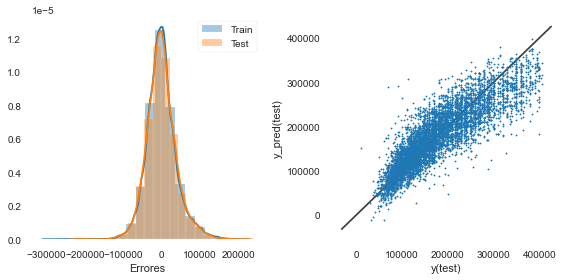

In [61]:
#Grafico los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data

evaluar_modelo(reg_lin, X_train_new, X_test_new, y_train, y_test)

In [62]:
#winsound.Beep(freq, duration)

Al aplicar el modelo de regresión con caracteres polinómicos por default (el grado polinómico por default es 2), se observa que los errores tanto del conjunto Test como Train, son muy parecidos. A su vez, se observa en el gráfico de dispersión, a los puntos mas cerca de la recta de regresión. 

**Importancia de los features**

In [63]:
#Guardo los coeficientes en una lista
coef_rlp = list(reg_lin.coef_.flatten())

Para obtener los nombres de los coeficentes, me ayudé con **get_feature_names()** y luego reemplazando x0, x1, x2, x3 y x4 por las variables 'rooms','bedrooms','bathrooms','surface_total','surface_covered.

In [64]:
#Para obtener los nombres de lo coeficientes
reg_poly.get_feature_names()

['polynomialfeatures__x0',
 'polynomialfeatures__x1',
 'polynomialfeatures__x2',
 'polynomialfeatures__x3',
 'polynomialfeatures__x4',
 'polynomialfeatures__x0^2',
 'polynomialfeatures__x0 x1',
 'polynomialfeatures__x0 x2',
 'polynomialfeatures__x0 x3',
 'polynomialfeatures__x0 x4',
 'polynomialfeatures__x1^2',
 'polynomialfeatures__x1 x2',
 'polynomialfeatures__x1 x3',
 'polynomialfeatures__x1 x4',
 'polynomialfeatures__x2^2',
 'polynomialfeatures__x2 x3',
 'polynomialfeatures__x2 x4',
 'polynomialfeatures__x3^2',
 'polynomialfeatures__x3 x4',
 'polynomialfeatures__x4^2',
 'l3_Abasto',
 'l3_Agronomía',
 'l3_Almagro',
 'l3_Balvanera',
 'l3_Barracas',
 'l3_Barrio Norte',
 'l3_Belgrano',
 'l3_Boca',
 'l3_Boedo',
 'l3_Caballito',
 'l3_Catalinas',
 'l3_Centro / Microcentro',
 'l3_Chacarita',
 'l3_Coghlan',
 'l3_Colegiales',
 'l3_Congreso',
 'l3_Constitución',
 'l3_Flores',
 'l3_Floresta',
 'l3_Las Cañitas',
 'l3_Liniers',
 'l3_Mataderos',
 'l3_Monserrat',
 'l3_Monte Castro',
 'l3_Nuñez',
 

In [65]:
 #Lista con los nombres de las variables para cada coeficiente
coef_names = ['rooms','bedrooms','bathrooms','surface_total','surface_covered', 'rooms^2', 'rooms_bedrooms', 
             'rooms_bathrooms', 'rooms_surface_total','rooms_surface_covered', 'bedrooms^2', 'bedrooms_bathrooms', 
             'bedrooms_surface_total','bedrooms_surface_covered', 'bathrooms^2','bathrooms_surface_total',
             'bathrooms_surface_covered', 'surface_total^2', 'surface_total_surface_covered', 'surface_covered^2',
             'l3_Abasto','l3_Agronomía','l3_Almagro','l3_Balvanera','l3_Barracas','l3_Barrio_Norte','l3_Belgrano',
             'l3_Boca','l3_Boedo','l3_Caballito','l3_Catalinas','l3_Centro_/_Microcentro','l3_Chacarita','l3_Coghlan',
             'l3_Colegiales','l3_Congreso','l3_Constitución','l3_Flores','l3_Floresta','l3_Las_Cañitas','l3_Liniers',
             'l3_Mataderos','l3_Monserrat','l3_Monte_Castro','l3_Nuñez','l3_Once','l3_Palermo','l3_Parque_Avellaneda',
             'l3_Parque_Centenario','l3_Parque_Chacabuco','l3_Parque_Chas','l3_Parque_Patricios','l3_Paternal','l3_Pompeya',
             'l3_Puerto_Madero','l3_Recoleta','l3_Retiro','l3_Saavedra','l3_San_Cristobal','l3_San_Nicolás','l3_San_Telmo',
             'l3_Tribunales','l3_Velez_Sarsfield','l3_Versalles','l3_Villa_Crespo','l3_Villa_Devoto','l3_Villa_General_Mitre',
             'l3_Villa_Lugano','l3_Villa_Luro','l3_Villa_Ortuzar','l3_Villa_Pueyrredón','l3_Villa_Real','l3_Villa_Riachuelo',
             'l3_Villa_Santa_Rita','l3_Villa_Soldati','l3_Villa_Urquiza','l3_Villa_del_Parque','property_type_Casa',
             'property_type_Departamento','property_type_PH'] 

In [66]:
#Hago una tabla con los coeficientes y el nombre de las variables para cada coeficiente. 
#La ordeno de mayor a menor en términos absolutos.
features_importance = pd.DataFrame()
index_ = coef_names 
features_importance['Coeficientes'] = (coef_rlp)
features_importance.index= index_
features_importance.sort_values(by=['Coeficientes'], ascending=False)

,Coeficientes
l3_Puerto_Madero,150183.351103
l3_Las_Cañitas,66134.572138
l3_Recoleta,55268.341896
l3_Belgrano,52545.667539
l3_Palermo,51982.615517
...,...
l3_Boca,-37079.189197
l3_Villa_Riachuelo,-48245.098401
l3_Pompeya,-55078.674062
l3_Villa_Lugano,-68749.790256


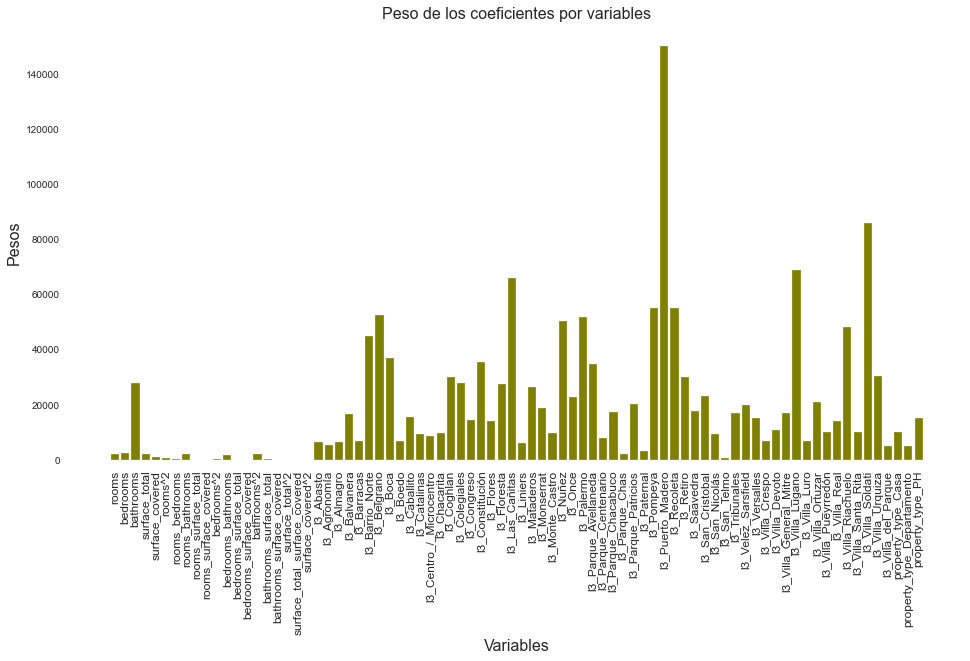

In [67]:
#Grafico los coeficientes (absolutos) y las variables
plt.figure(figsize = (16,8))
index = coef_names
plt.bar(index, np.abs(features_importance['Coeficientes']), color = 'olive')
plt.xlabel('Variables', fontsize=16)
plt.ylabel('Pesos', fontsize=16)
plt.xticks(index, fontsize=12, rotation=90)
plt.title('Peso de los coeficientes por variables', fontsize=16)
plt.show()

La variables con mas importancia fueron: los barrios de Puerto Madero, Villa Soldati, Villa Lugano y Las Cañitas.

A continuación, aplicaré la técnica de regularización, la cual, permite evitar el overfitting en los modelos, ya que fuerza a los modelos a ser lo mas simple posibles, penalizando en la función de costo a los parametros del modelo. 

Por otro lado, la regularización permite que los modelos puedan generalizar. Al hacer una RL con atributos polinómicos, el modelo es más complejo y ya es susceptible de generalizarse. Luego, al hacer la regularización eliminas los coeficientes que aportan poca o nula información  optimizando el modelo y ahora sí generalizándolo.

**Regularización con parámetros por default**

Voy a aplicar la regularización sobre el modelo obtenido anteriormente.

**Regularización con parámetros por default: Ridge**

Para Ridge el alpha por defaul es 1.

In [68]:
#Instancio el modelo
reg_ridge = Ridge() 

#Cross validation
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)
cv_results = abs(cross_val_score(reg_ridge, X_train_new, y_train, 
                                 cv=cv, scoring='neg_root_mean_squared_error'))
#Entreno el modelo
reg_ridge.fit(X_train_new, y_train)

Ridge()

In [69]:
print('Mejor Score en Train %0.2f (± %0.2f)' %
      (cv_results.mean(), cv_results.std()))
print('\nLos 15 RMSE (Train) son:', cv_results)

Mejor Score en Train 39080.93 (± 401.45)

Los 15 RMSE (Train) son: [39371.59091792 39405.58678445 39557.97156316 38745.76024208
 38310.43612588 39356.18426116 38652.54173623 39773.53493415
 39045.69910359 38586.93223599 38912.65942308 38867.36871845
 39131.93812284 39545.78695848 38949.98386019]


In [70]:
#Imprimo los coeficientes
[coef for coef in reg_ridge.coef_[0]]

[2247.3873227815093,
 2541.106310068598,
 27772.539711729485,
 2209.6455485200145,
 1011.650349004677,
 -576.6293038968092,
 -365.7807229306583,
 -2191.419992862656,
 61.36372123428263,
 -16.308106727355174,
 -558.5370625933931,
 -1755.052245639159,
 151.54460796301467,
 -163.51188263050526,
 -2211.107711131497,
 231.6142829469923,
 -106.66132594870801,
 -12.025421449056372,
 3.0439744329478042,
 0.3896408223341708,
 6456.668207376786,
 5356.9141370351135,
 6301.846098869963,
 -16849.992439289428,
 6933.6630431170415,
 44706.73664179609,
 52405.564123438126,
 -37055.601844064404,
 -6988.164661211109,
 15621.562836327397,
 -7139.287215939103,
 -8806.833822284565,
 9840.591212625824,
 30050.051362276452,
 27660.047567855534,
 -14720.821314810806,
 -35554.70731217388,
 -14442.486172398654,
 -27550.453403109525,
 65825.73425977275,
 -6308.091004099332,
 -26633.658833197493,
 -18999.581984279255,
 -9895.047398864024,
 50185.56501018035,
 -23113.61623165923,
 51851.30067831343,
 -34705.81497

Raiz del error cuadrático medio en Train: 39020.734878508185
Raiz del error cuadrático medio en Test: 38740.681295603186


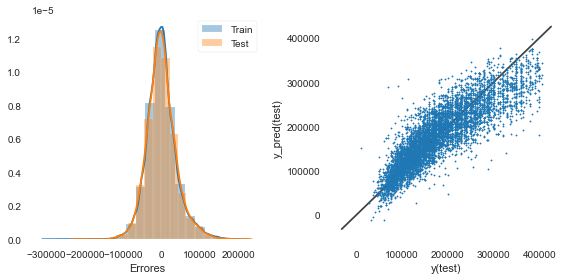

In [71]:
#Grafico los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data

evaluar_modelo(reg_ridge, X_train_new, X_test_new, y_train, y_test)

Al aplicarle al modelo la regularización de Ridge, se puede observar que, los errores no han disminuído. Los valores de los errores son exacatamente iguales a los obtenidos por el modelo sin regularizar.

In [72]:
#winsound.Beep(freq, duration)

**Importancia de las variables**

In [73]:
#Guardo los coeficientes en una lista
coef_rlp = list(reg_ridge.coef_.flatten())

In [74]:
#Lista con los nombres de las variables para cada coeficiente
coef_names = ['rooms','bedrooms','bathrooms','surface_total','surface_covered', 'rooms^2', 'rooms_bedrooms', 
          'rooms_bathrooms', 'rooms_surface_total','rooms_surface_covered', 'bedrooms^2', 'bedrooms_bathrooms', 
          'bedrooms_surface_total','bedrooms_surface_covered', 'bathrooms^2','bathrooms_surface_total',
          'bathrooms_surface_covered', 'surface_total^2', 'surface_total_surface_covered', 'surface_covered^2',
          'l3_Abasto','l3_Agronomía','l3_Almagro','l3_Balvanera','l3_Barracas','l3_Barrio_Norte','l3_Belgrano',
          'l3_Boca','l3_Boedo','l3_Caballito','l3_Catalinas','l3_Centro_/_Microcentro','l3_Chacarita','l3_Coghlan',
          'l3_Colegiales','l3_Congreso','l3_Constitución','l3_Flores','l3_Floresta','l3_Las_Cañitas','l3_Liniers',
          'l3_Mataderos','l3_Monserrat','l3_Monte_Castro','l3_Nuñez','l3_Once','l3_Palermo','l3_Parque_Avellaneda',
          'l3_Parque_Centenario','l3_Parque_Chacabuco','l3_Parque_Chas','l3_Parque_Patricios','l3_Paternal','l3_Pompeya',
          'l3_Puerto_Madero','l3_Recoleta','l3_Retiro','l3_Saavedra','l3_San_Cristobal','l3_San_Nicolás','l3_San_Telmo',
          'l3_Tribunales','l3_Velez_Sarsfield','l3_Versalles','l3_Villa_Crespo','l3_Villa_Devoto','l3_Villa_General_Mitre',
          'l3_Villa_Lugano','l3_Villa_Luro','l3_Villa_Ortuzar','l3_Villa_Pueyrredón','l3_Villa_Real','l3_Villa_Riachuelo',
          'l3_Villa_Santa_Rita','l3_Villa_Soldati','l3_Villa_Urquiza','l3_Villa_del_Parque','property_type_Casa',
          'property_type_Departamento','property_type_PH'] 

In [75]:
#Hago una tabla con los coeficientes y el nombre de las variables para cada coeficiente. 
#La ordeno de mayor a menor en términos absoluto
features_importance = pd.DataFrame()
index_ = coef_names 
features_importance['Coeficientes'] = (coef_rlp)
features_importance.index= index_
features_importance.sort_values(by=['Coeficientes'], ascending=False)

,Coeficientes
l3_Puerto_Madero,149536.295010
l3_Las_Cañitas,65825.734260
l3_Recoleta,55124.264963
l3_Belgrano,52405.564123
l3_Palermo,51851.300678
...,...
l3_Boca,-37055.601844
l3_Villa_Riachuelo,-46932.732984
l3_Pompeya,-54751.671673
l3_Villa_Lugano,-68661.146880


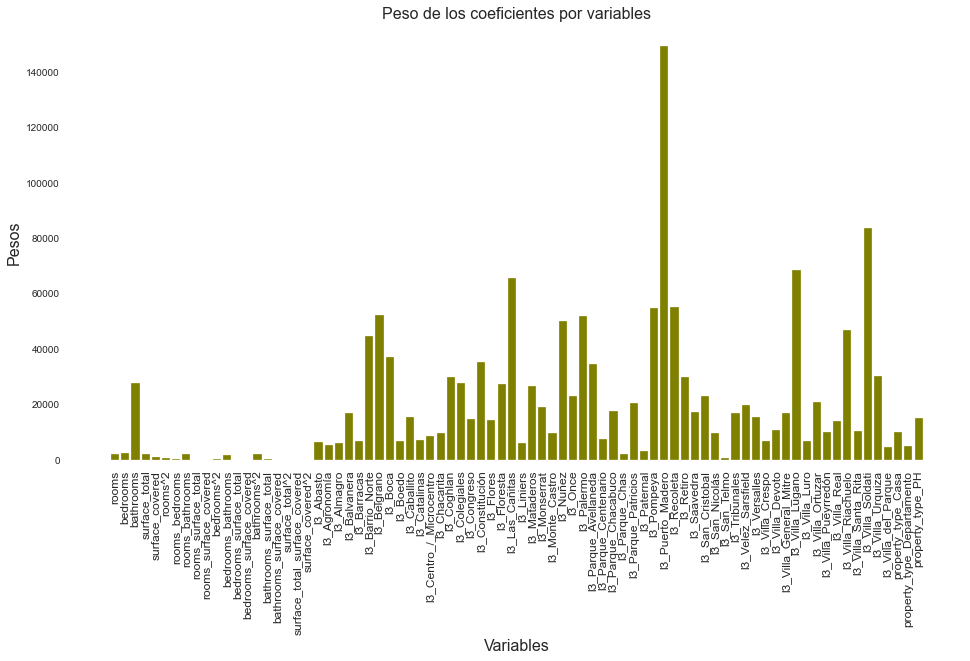

In [76]:
#Grafico los coeficientes (absolutos) y las variables
plt.figure(figsize = (16,8))
index = coef_names
plt.bar(index, np.abs(features_importance['Coeficientes']), color = 'olive')
plt.xlabel('Variables', fontsize=16)
plt.ylabel('Pesos', fontsize=16)
plt.xticks(index, fontsize=12, rotation=90)
plt.title('Peso de los coeficientes por variables', fontsize=16)
plt.show()

Las variables con mas importancia fueron: los barrios Puerto Madero, Villa Soldati, Villa Lugano y Las Cañitas.

**Regularización con parámetros por default: Lasso**

Por default, el alpha en Lasso es 1.

In [77]:
#Instancio el modelo
reg_lasso = Lasso()

#Cross validation
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)
cv_results = abs(cross_val_score(reg_lasso, X_train_new, y_train, 
                                 cv=cv, scoring='neg_root_mean_squared_error'))
#Entreno el modelo
reg_lasso.fit(X_train_new, y_train)

Lasso()

In [78]:
print('Mejor Score en Train %0.2f (± %0.2f)' %
      (cv_results.mean(), cv_results.std()))

print('\nLos 15 RMSE (Train) son:', cv_results)

Mejor Score en Train 39080.24 (± 401.26)

Los 15 RMSE (Train) son: [39367.79814643 39406.27992346 39559.70338553 38745.8926027
 38309.73000548 39353.27652505 38651.72001639 39773.71193069
 39046.28977758 38587.03733981 38911.14319422 38867.29362764
 39132.10399967 39542.31403512 38949.30524659]


In [79]:
#Imprimo los coeficientes
[coef for coef in reg_lasso.coef_]

[2528.7217362189817,
 2626.888908276528,
 27905.592166336002,
 2189.235768780355,
 1021.391105046208,
 -680.6782143143845,
 -435.36672044437313,
 -2407.337382109301,
 84.00029468855898,
 -31.909354854832362,
 -370.1209524454743,
 -1612.6284078674953,
 123.5251380122407,
 -142.40149392534215,
 -2258.953659622656,
 233.85344288932438,
 -103.80658928638208,
 -11.976402116394112,
 2.9777905930291944,
 0.378650077993427,
 10270.297347082855,
 8866.776865211397,
 10250.743106820231,
 -12876.977932272912,
 10832.54647759082,
 48662.78588431946,
 56360.001937840716,
 -32960.79460357083,
 -2939.3796078249047,
 19568.259480805536,
 -0.0,
 -4688.212196084101,
 13718.907116522616,
 33920.46173174341,
 31598.56734780055,
 -10670.288165968426,
 -31501.09308214117,
 -10453.953248337695,
 -23533.91521653292,
 69756.50048893748,
 -2254.9467914223383,
 -22571.371565437406,
 -14974.224537298365,
 -5800.402573708793,
 54145.77929623513,
 -19083.75428559522,
 55807.890293556484,
 -30538.081217695097,
 1162

Raiz del error cuadrático medio en Train: 39021.02899218448
Raiz del error cuadrático medio en Test: 38740.35791716215


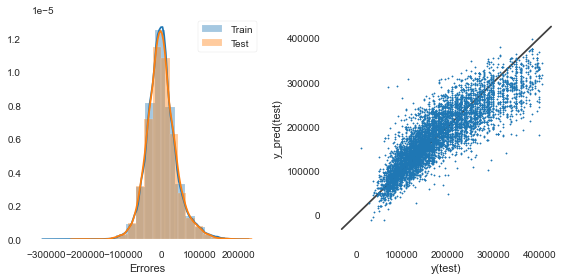

In [80]:
#Grafico los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data

evaluar_modelo(reg_lasso, X_train_new, X_test_new, y_train, y_test, True)

In [81]:
#winsound.Beep(freq, duration)

Al aplicarle al modelo la regularización de Lasso, el resultado de los errores obtenidos fue igual al obtenido con Ridge (diferencia de 1 en Train) e igual al obtendio por el modelo sin regularizar.

In [82]:
#Guardo los coeficientes en una lista
coef_rlp = list(reg_lasso.coef_.flatten())

In [83]:
#Lista con los nombres de las variables para cada coeficiente
coef_names = ['rooms','bedrooms','bathrooms','surface_total','surface_covered', 'rooms^2', 'rooms_bedrooms', 
          'rooms_bathrooms', 'rooms_surface_total','rooms_surface_covered', 'bedrooms^2', 'bedrooms_bathrooms', 
          'bedrooms_surface_total','bedrooms_surface_covered', 'bathrooms^2','bathrooms_surface_total',
          'bathrooms_surface_covered', 'surface_total^2', 'surface_total_surface_covered', 'surface_covered^2',
          'l3_Abasto','l3_Agronomía','l3_Almagro','l3_Balvanera','l3_Barracas','l3_Barrio_Norte','l3_Belgrano',
          'l3_Boca','l3_Boedo','l3_Caballito','l3_Catalinas','l3_Centro_/_Microcentro','l3_Chacarita','l3_Coghlan',
          'l3_Colegiales','l3_Congreso','l3_Constitución','l3_Flores','l3_Floresta','l3_Las_Cañitas','l3_Liniers',
          'l3_Mataderos','l3_Monserrat','l3_Monte_Castro','l3_Nuñez','l3_Once','l3_Palermo','l3_Parque_Avellaneda',
          'l3_Parque_Centenario','l3_Parque_Chacabuco','l3_Parque_Chas','l3_Parque_Patricios','l3_Paternal','l3_Pompeya',
          'l3_Puerto_Madero','l3_Recoleta','l3_Retiro','l3_Saavedra','l3_San_Cristobal','l3_San_Nicolás','l3_San_Telmo',
          'l3_Tribunales','l3_Velez_Sarsfield','l3_Versalles','l3_Villa_Crespo','l3_Villa_Devoto','l3_Villa_General_Mitre',
          'l3_Villa_Lugano','l3_Villa_Luro','l3_Villa_Ortuzar','l3_Villa_Pueyrredón','l3_Villa_Real','l3_Villa_Riachuelo',
          'l3_Villa_Santa_Rita','l3_Villa_Soldati','l3_Villa_Urquiza','l3_Villa_del_Parque','property_type_Casa',
          'property_type_Departamento','property_type_PH'] 

In [84]:
#Hago una tabla con los coeficientes y el nombre de las variables para cada coeficiente. 
#La ordeno de mayor a menor en términos absoluto
features_importance = pd.DataFrame()
index_ = coef_names 
features_importance['Coeficientes'] = (coef_rlp)
features_importance.index= index_
features_importance.sort_values(by=['Coeficientes'], ascending=False)

,Coeficientes
l3_Puerto_Madero,153795.130719
l3_Las_Cañitas,69756.500489
l3_Recoleta,59082.987858
l3_Belgrano,56360.001938
l3_Palermo,55807.890294
...,...
l3_Boca,-32960.794604
l3_Villa_Riachuelo,-42375.164445
l3_Pompeya,-50709.761422
l3_Villa_Lugano,-64723.482455


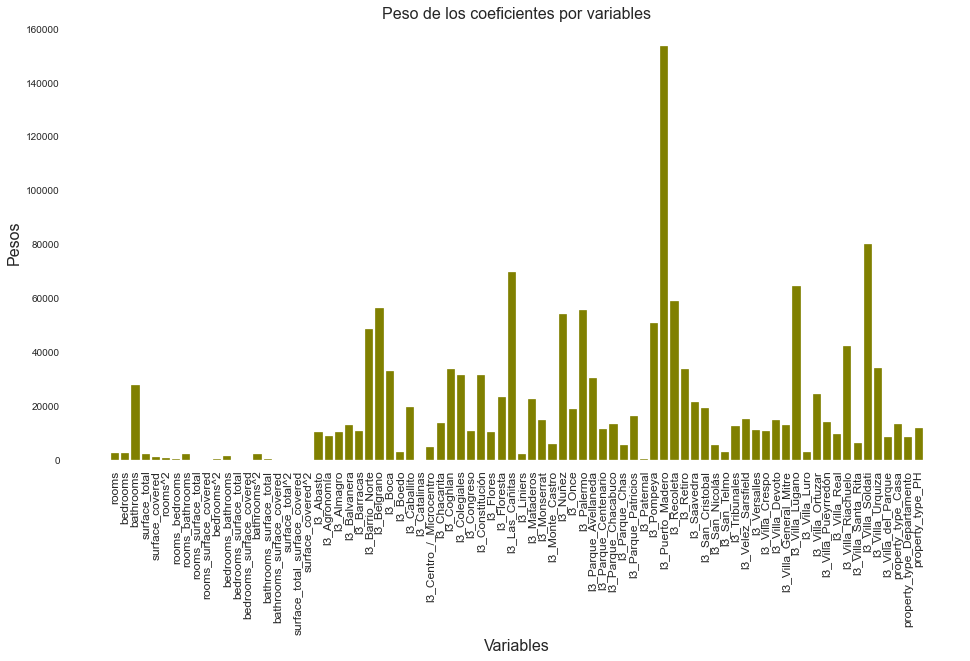

In [85]:
#Grafico los coeficientes (absolutos) y las variables
plt.figure(figsize = (16,8))
index = coef_names
plt.bar(index, np.abs(features_importance['Coeficientes']), color = 'olive')
plt.xlabel('Variables', fontsize=16)
plt.ylabel('Pesos', fontsize=16)
plt.xticks(index, fontsize=12, rotation=90)
plt.title('Peso de los coeficientes por variables', fontsize=16)
plt.show()

Las variables con mas importancia fueron: los barrios de Puerto Madero, Villa Soldati, Las Cañitas y Villa Lugano.

**Conclusión parcial:** La aplicación de caracteres polinómicos a la regresión lineal, dió como resultado que los RMSE tanto de train como de test sean similares (la diferencia entre ellos es de 280). Al aplicar la regularización, tanto de Ridge como de Lasso, la diferencia a nivel de RMSE fue casi imperceptible (variaciones de 1). Esto nos estaría indicando, que el modelo sin regularizar, ya era un muy buen modelo. 

En relación a la importancia de las variables en el modelo, fueron las mismas para los tres modelos. Siendo estas variables las correspondientes a los barrios con precios promedios mas altos (Puerto Madero y Las Cañitas: coeficientes positivos) y de los mas bajos (Villa Lugano y Villa Soldati: coeficientes negativos).

In [86]:
#Medias de precio por barrio
barrios_caros = data_final.groupby('l3')[['price']].mean()
barrios_caros.sort_values(by=['price'], ascending=False)

,price
l3,
Puerto Madero,310300.574018
Las Cañitas,228680.512136
Recoleta,224236.786639
Belgrano,218579.268215
Barrio Norte,210670.746720
Nuñez,205787.481766
Palermo,204393.012957
Parque Centenario,187893.127589
Retiro,187598.766187


**7.	Optimiza sus hiperparámetros mediante Validación Cruzada y Grid Search o Random Search.** 

**i. Regresión polinómica con cross validation y Grid Search**

In [87]:
#Defino el dataset
data_rlp_gs = data_encoded.copy()
data_rlp_gs.head()
#data_rlp_gs.shape

,rooms,bedrooms,price,bathrooms,surface_total,surface_covered,l3_Abasto,l3_Agronomía,l3_Almagro,l3_Balvanera,...,l3_Villa Pueyrredón,l3_Villa Real,l3_Villa Riachuelo,l3_Villa Santa Rita,l3_Villa Soldati,l3_Villa Urquiza,l3_Villa del Parque,Propiedad_Casa,Propiedad_Departamento,Propiedad_PH
0,2.0,1.0,159000.0,2.0,70.0,58.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,2.0,1.0,125000.0,1.0,45.0,45.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,2.0,1.0,295000.0,1.0,85.0,50.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,2.0,1.0,150000.0,1.0,56.0,56.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,2.0,1.0,159500.0,1.0,70.0,70.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [88]:
#Resumen conciso del dataframe
#data_rlp_gs.info()

In [89]:
#Defino la X y la y
X = data_rlp_gs.iloc[:, np.r_[0,1,3:66]] #todas menos 'price'
y = data_rlp_gs.iloc[:, [2]] #price

In [90]:
#Defino el train/test/split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

**NOTA:** Para desarrollar este modelo, las variables con posibilidad de escalado son superficie total y superficie cubierta, ambas con la misma escala, por lo que no realizaré escalado.

La incorporación de atributos polinómicos lo hice sólo en las variables que no habían sido 'encodeadeas', es decir, sólo en  ambientes, baños, habitaciones, superficie total y superficie cubierta. Esto lo realizé utilizando **make_column_transformer**, la cual construye un ColumnTransformer a partir de los transformadores dados. 

También, utilicé **make_pipeline** que permite construir pipelines para los estimadores especificados.

In [91]:
#Instancio el modelo de regresión lineal
reg_lin_2 = LinearRegression()

#Aplico los atributos polinómicos
columns = ["rooms", "bedrooms", "bathrooms", "surface_total", "surface_covered"]
reg_poly_2 = make_column_transformer((PolynomialFeatures(include_bias = False), columns),
                                       remainder= 'passthrough')                
#Defino el pipeline
pipeline_poly = make_pipeline (reg_poly_2, reg_lin_2)

Para definir la grilla, con los hiperparámetros a optimizar, voy a colocar el grado polinómico. Los valores que utilicé, fueron lo que me parecían que podían ser útiles por bibliografía y los utilizados en clase. De cualquier modo, corrí el modelo con GridSearch y corroboré que el valor elegido, no haya sido un extremo de la escala de valores dados (de ser así, agregaría mas valores).

In [92]:
#Defino la grilla para utilizar en el GridSearch
param_grid = {
            'columntransformer__polynomialfeatures__degree': np.arange(6)
             }

In [93]:
#Defino el modelo 
cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
model_2 = GridSearchCV(pipeline_poly, param_grid, cv=cv, 
                     scoring = 'neg_root_mean_squared_error')

In [94]:
#Entreno el modelo
model_2.fit(X_train, y_train)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=42),
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('polynomialfeatures',
                                                                         PolynomialFeatures(include_bias=False),
                                                                         ['rooms',
                                                                          'bedrooms',
                                                                          'bathrooms',
                                                                          'surface_total',
                                                                          'surface_covered'])])),
                                       ('linearregression',
                                        LinearRegression())]),
       

In [95]:
print ('Los mejores parámetros son:' + str(model_2.best_params_) + '\n')
print ('El mejor score es:' + str(abs(model_2.best_score_)))

Los mejores parámetros son:{'columntransformer__polynomialfeatures__degree': 4}

El mejor score es:38807.01491180503


In [96]:
#Uso los mejores parámetros
reg_poly_2 = make_column_transformer((PolynomialFeatures(include_bias = False, 
                                     degree=model_2.best_params_['columntransformer__polynomialfeatures__degree']), columns),
                                     remainder= 'passthrough')
#Defino la nueva X_train
X_train_new_2 = reg_poly_2.fit_transform(X_train)
X_test_new_2 = reg_poly_2.transform(X_test)

In [97]:
#Entreno el modelo
reg_lin_2.fit(X_train_new_2, y_train)

LinearRegression()

Raiz del error cuadrático medio en Train: 38572.048920147994
Raiz del error cuadrático medio en Test: 38438.43761672022


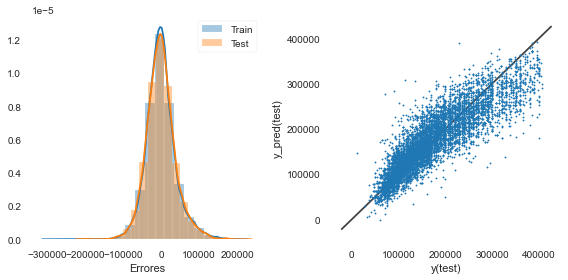

In [98]:
#Grafico los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data
    
evaluar_modelo(reg_lin_2, X_train_new_2, X_test_new_2, y_train, y_test)

In [99]:
#winsound.Beep(freq, duration)

En este modelo de regresión lineal con caracteres polinómicos, cuyos hiperparámetros fueron optimizados por Grid Search, se observa un modelo cuyo grado polinómico óptimo fue 4. La diferencia entre los RMSE en el set de testeo y de entrenamiento, son muy similares, dando idea de que no hay overfitting en el modelo.

**Importancia de las variables**

In [100]:
#Guardo los coeficientes en una lista
coef_rlp_gs = list(reg_lin_2.coef_.flatten())

Para obtener los nombres de los coeficentes, me ayudé con **get_feature_names()** y luego reemplazando x0, x1, x2, x3 y x4 por las variables 'rooms','bedrooms','bathrooms','surface_total','surface_covered.

In [101]:
#Para obtener los nombres de lo coeficientes
reg_poly_2.get_feature_names()

['polynomialfeatures__x0',
 'polynomialfeatures__x1',
 'polynomialfeatures__x2',
 'polynomialfeatures__x3',
 'polynomialfeatures__x4',
 'polynomialfeatures__x0^2',
 'polynomialfeatures__x0 x1',
 'polynomialfeatures__x0 x2',
 'polynomialfeatures__x0 x3',
 'polynomialfeatures__x0 x4',
 'polynomialfeatures__x1^2',
 'polynomialfeatures__x1 x2',
 'polynomialfeatures__x1 x3',
 'polynomialfeatures__x1 x4',
 'polynomialfeatures__x2^2',
 'polynomialfeatures__x2 x3',
 'polynomialfeatures__x2 x4',
 'polynomialfeatures__x3^2',
 'polynomialfeatures__x3 x4',
 'polynomialfeatures__x4^2',
 'polynomialfeatures__x0^3',
 'polynomialfeatures__x0^2 x1',
 'polynomialfeatures__x0^2 x2',
 'polynomialfeatures__x0^2 x3',
 'polynomialfeatures__x0^2 x4',
 'polynomialfeatures__x0 x1^2',
 'polynomialfeatures__x0 x1 x2',
 'polynomialfeatures__x0 x1 x3',
 'polynomialfeatures__x0 x1 x4',
 'polynomialfeatures__x0 x2^2',
 'polynomialfeatures__x0 x2 x3',
 'polynomialfeatures__x0 x2 x4',
 'polynomialfeatures__x0 x3^2',
 '

In [102]:
#Lista con los nombres de las variables para cada coeficiente
coef_names_gs = ['rooms','bedrooms','bathrooms','surface_total','surface_covered','rooms^2','rooms_bedrooms','rooms_bathrooms',
            'rooms_surface_total','rooms_surface_covered','bedrooms^2','bedrooms_bahrooms','bedrooms_surface_total',
            'bedrooms_surface_covered','bathrooms^2','bathrooms_surface_total','bathrooms_surface_covered','surface_total^2',
            'surface_total_surface_covered','surfce_covered^2','rooms^3','rooms^2_bedrooms','rooms^2_bathrooms',
            'rooms^2_surface_total','rooms^2_surface_covered','rooms_bedrooms^2','rooms_bedrooms_bathrooms',
            'rooms_bedrooms_surface_otal','rooms_bedrooms_surface_covered','rooms_bathrooms^2','rooms_bathrooms_surface_total',
            'rooms_bathrooms_surface_covered','rooms_surface_total^2','rooms_surface_total_surface_covered','rooms_surface_covered^2',
            'bedrooms^3','bedrooms^2_bathrooms','bedrooms^2_surface_total','bedrooms^2_surfac_covered','bedrooms_bathrooms^2',
            'bedrooms_bathrooms_surface_total','bedrooms_bathrooms_surface_covered','bedrooms_surface_total^2',
            'bedrooms_surface_total_surface_covered','bedrooms_urface_covered^2','bathrooms^3','bathrooms^2_surface_total',
            'bathrooms^2_surface_covered','bathrooms_surface_total^2','bathrooms_surface_total_surface_covered',
            'bathrooms_surface_coveed^2','surface_total^3','surface_total^2_surface_covered','surface_total_surface_covered^2',
            'surface_covered^3','rooms^4','rooms^3_bedrooms','rooms^3_bathrooms','rooms^3_surface_total',
            'rooms^3_surface_covered','rooms^2_bedrooms^2','rooms^2_bedrooms_bathrooms','rooms^2_bedrooms_surface_total',
            'rooms^2_bedrooms_surface_covered','rooms^2_bathrooms^2','rooms^2_bathroos_surface_total',
            'rooms^2_bathrooms_surface_covered','rooms^2_surface_total^2','rooms^2_surface_total_surface_covered',
            'rooms^2_surface_covered^2','rooms_bedrooms^3','rooms_bedrooms^2bathrooms','rooms_bedrooms^2_surface_total',
            'rooms_bedrooms^2_surface_covered','rooms_bedrooms_bathrooms^2','rooms_bedrooms_bathrooms_surface_total',
            'rooms_bedrooms_bathrooms_surface_overed','rooms_bedrooms_surface_total^2',
            'rooms_bedrooms_surface_total_surface_covered','rooms_bedrooms_surface_covered^2','rooms_bathrooms^3',
            'rooms_bathrooms^2_surface_total','roomsbathrooms^2_surface_covered','rooms_bathrooms_surface_total^2',
            'rooms_bathrooms_surface_total_surface_covered','rooms_bathrooms_surface_covered^2','rooms_surface_total^3',
            'rooms_surfae_total^2_surface_covered','rooms_surface_total_surface_covered^2','rooms_surface_covered^3',
            'bedrooms^4','bedrooms^3_bathrooms','bedrooms^3_surface_total','bedrooms^3_surface_covered',
            'bedrooms^2_bathrooms^2','bedrooms^2_bathrooms_surface_total','bedrooms^2_bathrooms_surface_covered',
            'bedrooms^2_surface_total^2','bedrooms^2_surface_total_surface_covered','bedrooms2_surface_covered^2',
            'bedrooms_bathrooms^3','bedrooms_bathrooms^2_surface_total','bedrooms_bathrooms^2_surface_covered',
            'bedrooms_bathrooms_surface_total^2','bedrooms_bathrooms_surfac_total_surface_covered',
            'bedrooms_bathrooms_surface_covered^2','bedrooms_surface_total^3','bedrooms_surface_total^2_surface_covered',
            'bedrooms_surface_total_surface_covered^2','bedroos_surface_covered^3','bathrooms^4',
            'bathrooms^3_surface_total','bathrooms^3_surface_covered','bathrooms^2_surface_total^2',
            'bathrooms^2_surface_total_surface_covered','bathrooms^2_surace_covered^2','bathrooms_surface_total^3',
            'bathrooms_surface_total^2_surface_covered','bathrooms_surface_total_surface_covered^2',
            'bathrooms_surface_covered^3','surface_total^4','surace_total^3_surface_covered',
            'surface_total^2_surface_covered^2','surface_total_surface_covered^3','surface_covered^4','l3_Abasto',
            'l3_Agronomía','l3_Almagro','l3_Balvanera','l3_Barraas','l3_Barrio_Norte','l3_Belgrano','l3_Boca','l3_Boedo',
            'l3_Caballito','l3_Catalinas','l3_Centro_/_Microcentro','l3_Chacarita','l3_Coghlan','l3_Colegiales',
            'l3_Congreso','l3_Constituión','l3_Flores','l3_Floresta','l3_Las_Cañitas','l3_Liniers','l3_Mataderos',
            'l3_Monserrat','l3_Monte_Castro','l3_Nuñez','l3_Once','l3_Palermo','l3_Parque_Avellaneda','l3_Parque_Centenrio',
            'l3_Parque_Chacabuco','l3_Parque_Chas','l3_Parque_Patricios','l3_Paternal','l3_Pompeya','l3_Puerto_Madero',
            'l3_Recoleta','l3_Retiro','l3_Saavedra','l3_San_Cristobal','l3_San_Nicolás','l3_San_Telmo','l3_Tribunales',
            'l3_Vele_Sarsfield','l3_Versalles','l3_Villa_Crespo','l3_Villa_Devoto','l3_Villa_General_Mitre',
            'l3_Villa_Lugano','l3_Villa_Luro','l3_Villa_Ortuzar','l3_Villa_Pueyrredón','l3_Villa_Real','l3_Vila_Riachuelo',
            'l3_Villa_Santa_Rita','l3_Villa_Soldati','l3_Villa_Urquiza','l3_Villa_del_Parque','Propiedad_Casa',
            'Propiedad_Departamento','Propiedad_PH']

In [103]:
#Hago una tabla con los coeficientes y el nombre de las variables para cada coeficiente. 
#La ordeno de mayor a menor en términos absoluto
features_importance = pd.DataFrame()
index_ = coef_names_gs 
features_importance['Coeficientes'] = (coef_rlp_gs)
features_importance.index= index_
features_importance.sort_values(by=['Coeficientes'], ascending=False)

,Coeficientes
rooms_bathrooms,2.913911e+08
rooms_bathrooms^3,2.648814e+07
l3_Puerto_Madero,1.489995e+05
l3_Las_Cañitas,6.664650e+04
l3_Recoleta,5.568660e+04
...,...
l3_Pompeya,-5.341900e+04
l3_Villa_Lugano,-6.727025e+04
l3_Villa_Soldati,-8.505070e+04
rooms_bathrooms^2,-1.589158e+08


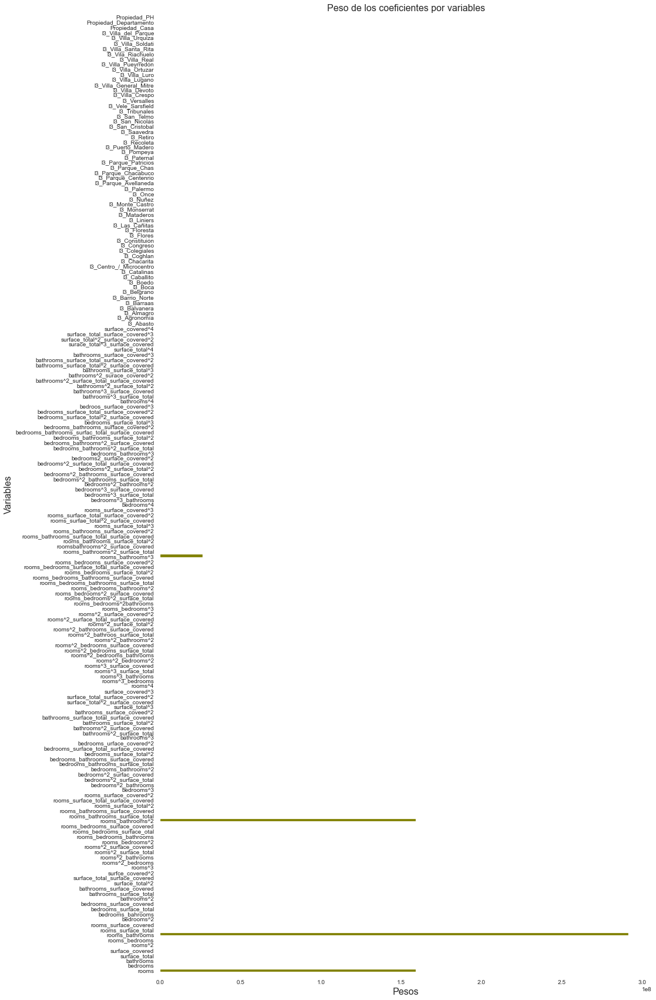

In [104]:
#Grafico los coeficientes (absolutos) y las variables
plt.figure(figsize = (15,30))
index = coef_names_gs
ax = np.abs(features_importance['Coeficientes']).plot.barh(color = 'olive')
plt.xlabel('Pesos', fontsize=16)
plt.ylabel('Variables', fontsize=16)
plt.title('Peso de los coeficientes por variables', fontsize=16)
plt.show()

La variables que mas importancia tuvieron fueron: rooms * bathrooms, rooms y rooms * bathrooms^2.

**Regularización con GridSearch**

Voy a aplicar la regularización sobre el modelo obtenido anteriormente.

**GridSearchCV y Ridge**

El hiperparámetro parámetro a optimizar fue el valor de alpha correspondiente a Ridge. Los valores a probar, fueron los sugeridos de acuerdo a la bibliografía y los usados durante las clases. Nuevamente, si el valor sugerido por el GS, correspondía a un extremo de la lista de valores a probar, agregaba valores nuevos.

In [105]:
#Instancio el modelo
reg_ridge_gs = Ridge()

#Defino los parámetros a usar en el GridSearchCV
parameters = {
              "alpha": [10, 5, 1, 0.5, 0.1]
            }

cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
grid = GridSearchCV(estimator=reg_ridge_gs, param_grid = parameters, cv = cv)

#Entreno el modelo
grid.fit(X_train_new_2, y_train)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=42),
             estimator=Ridge(), param_grid={'alpha': [10, 5, 1, 0.5, 0.1]})

In [106]:
#Imprimo los mejores parámetros
print(grid.best_params_)

{'alpha': 5}


In [107]:
#Entreno el modelo con los mejores parámetros
reg_ridge_gs = Ridge(alpha = grid.best_params_['alpha'])
reg_ridge_gs.fit(X_train_new_2, y_train)

Ridge(alpha=5)

In [108]:
#Imprimo los coeficientes
[coef for coef in reg_ridge_gs.coef_[0]]

[-6262.436408101335,
 9773.856454168252,
 -4021.446023296723,
 793.240440542211,
 594.7005210600543,
 -5212.200551127536,
 -1333.4126006845522,
 5484.093117298321,
 2126.4369942124686,
 -1806.4122189174536,
 20377.431669604364,
 11922.00601577485,
 -594.102590793363,
 -932.2363583902318,
 -9570.911376138674,
 -217.31226468919095,
 1139.415190223377,
 -63.20242787812595,
 131.22380888845652,
 -30.742052969159005,
 -8970.412802580617,
 14903.149013816825,
 -528.1786749563938,
 184.7143429154981,
 756.1042210081354,
 -1445.2530469577969,
 -18848.29854135047,
 -1352.1884169680561,
 733.6776670729738,
 16172.343360692666,
 1452.9309546031593,
 -1786.6246655774573,
 -16.488030663216787,
 -32.11476120475873,
 19.539194493432532,
 1776.2558522578731,
 12264.446388626357,
 481.84709076957745,
 -1549.7670778211652,
 11401.362877580994,
 32.80093261629932,
 -867.3842266411868,
 0.6959312309447837,
 60.26046743780355,
 4.559134857619913,
 -13189.561904385475,
 -1167.6583664942937,
 1488.8145898167

Raiz del error cuadrático medio en Train: 38574.975916368574
Raiz del error cuadrático medio en Test: 38442.89447465973


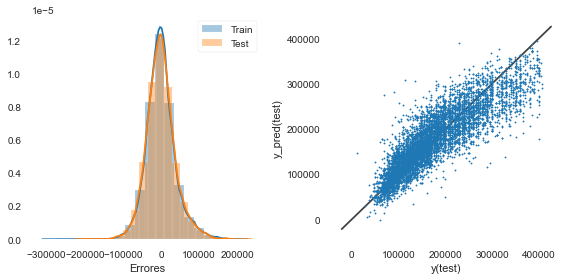

In [109]:
#Grafico los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data

evaluar_modelo(reg_ridge_gs, X_train_new_2, X_test_new_2, y_train, y_test)

In [110]:
#winsound.Beep(freq, duration)

**Importancia de las variables**

In [111]:
#Guardo los coeficientes en una lista
coef_rlp_gs = list(reg_ridge_gs.coef_.flatten())

In [112]:
#Lista con los nombres de las variables para cada coeficiente
coef_names_gs = ['rooms','bedrooms','bathrooms','surface_total','surface_covered','rooms^2','rooms_bedrooms','rooms_bathrooms',
            'rooms_surface_total','rooms_surface_covered','bedrooms^2','bedrooms_bahrooms','bedrooms_surface_total',
            'bedrooms_surface_covered','bathrooms^2','bathrooms_surface_total','bathrooms_surface_covered','surface_total^2',
            'surface_total_surface_covered','surfce_covered^2','rooms^3','rooms^2_bedrooms','rooms^2_bathrooms',
            'rooms^2_surface_total','rooms^2_surface_covered','rooms_bedrooms^2','rooms_bedrooms_bathrooms',
            'rooms_bedrooms_surface_otal','rooms_bedrooms_surface_covered','rooms_bathrooms^2','rooms_bathrooms_surface_total',
            'rooms_bathrooms_surface_covered','rooms_surface_total^2','rooms_surface_total_surface_covered','rooms_surface_covered^2',
            'bedrooms^3','bedrooms^2_bathrooms','bedrooms^2_surface_total','bedrooms^2_surfac_covered','bedrooms_bathrooms^2',
            'bedrooms_bathrooms_surface_total','bedrooms_bathrooms_surface_covered','bedrooms_surface_total^2',
            'bedrooms_surface_total_surface_covered','bedrooms_urface_covered^2','bathrooms^3','bathrooms^2_surface_total',
            'bathrooms^2_surface_covered','bathrooms_surface_total^2','bathrooms_surface_total_surface_covered',
            'bathrooms_surface_coveed^2','surface_total^3','surface_total^2_surface_covered','surface_total_surface_covered^2',
            'surface_covered^3','rooms^4','rooms^3_bedrooms','rooms^3_bathrooms','rooms^3_surface_total',
            'rooms^3_surface_covered','rooms^2_bedrooms^2','rooms^2_bedrooms_bathrooms','rooms^2_bedrooms_surface_total',
            'rooms^2_bedrooms_surface_covered','rooms^2_bathrooms^2','rooms^2_bathroos_surface_total',
            'rooms^2_bathrooms_surface_covered','rooms^2_surface_total^2','rooms^2_surface_total_surface_covered',
            'rooms^2_surface_covered^2','rooms_bedrooms^3','rooms_bedrooms^2bathrooms','rooms_bedrooms^2_surface_total',
            'rooms_bedrooms^2_surface_covered','rooms_bedrooms_bathrooms^2','rooms_bedrooms_bathrooms_surface_total',
            'rooms_bedrooms_bathrooms_surface_overed','rooms_bedrooms_surface_total^2',
            'rooms_bedrooms_surface_total_surface_covered','rooms_bedrooms_surface_covered^2','rooms_bathrooms^3',
            'rooms_bathrooms^2_surface_total','roomsbathrooms^2_surface_covered','rooms_bathrooms_surface_total^2',
            'rooms_bathrooms_surface_total_surface_covered','rooms_bathrooms_surface_covered^2','rooms_surface_total^3',
            'rooms_surfae_total^2_surface_covered','rooms_surface_total_surface_covered^2','rooms_surface_covered^3',
            'bedrooms^4','bedrooms^3_bathrooms','bedrooms^3_surface_total','bedrooms^3_surface_covered',
            'bedrooms^2_bathrooms^2','bedrooms^2_bathrooms_surface_total','bedrooms^2_bathrooms_surface_covered',
            'bedrooms^2_surface_total^2','bedrooms^2_surface_total_surface_covered','bedrooms2_surface_covered^2',
            'bedrooms_bathrooms^3','bedrooms_bathrooms^2_surface_total','bedrooms_bathrooms^2_surface_covered',
            'bedrooms_bathrooms_surface_total^2','bedrooms_bathrooms_surfac_total_surface_covered',
            'bedrooms_bathrooms_surface_covered^2','bedrooms_surface_total^3','bedrooms_surface_total^2_surface_covered',
            'bedrooms_surface_total_surface_covered^2','bedroos_surface_covered^3','bathrooms^4',
            'bathrooms^3_surface_total','bathrooms^3_surface_covered','bathrooms^2_surface_total^2',
            'bathrooms^2_surface_total_surface_covered','bathrooms^2_surace_covered^2','bathrooms_surface_total^3',
            'bathrooms_surface_total^2_surface_covered','bathrooms_surface_total_surface_covered^2',
            'bathrooms_surface_covered^3','surface_total^4','surace_total^3_surface_covered',
            'surface_total^2_surface_covered^2','surface_total_surface_covered^3','surface_covered^4','l3_Abasto',
            'l3_Agronomía','l3_Almagro','l3_Balvanera','l3_Barraas','l3_Barrio_Norte','l3_Belgrano','l3_Boca','l3_Boedo',
            'l3_Caballito','l3_Catalinas','l3_Centro_/_Microcentro','l3_Chacarita','l3_Coghlan','l3_Colegiales',
            'l3_Congreso','l3_Constituión','l3_Flores','l3_Floresta','l3_Las_Cañitas','l3_Liniers','l3_Mataderos',
            'l3_Monserrat','l3_Monte_Castro','l3_Nuñez','l3_Once','l3_Palermo','l3_Parque_Avellaneda','l3_Parque_Centenrio',
            'l3_Parque_Chacabuco','l3_Parque_Chas','l3_Parque_Patricios','l3_Paternal','l3_Pompeya','l3_Puerto_Madero',
            'l3_Recoleta','l3_Retiro','l3_Saavedra','l3_San_Cristobal','l3_San_Nicolás','l3_San_Telmo','l3_Tribunales',
            'l3_Vele_Sarsfield','l3_Versalles','l3_Villa_Crespo','l3_Villa_Devoto','l3_Villa_General_Mitre',
            'l3_Villa_Lugano','l3_Villa_Luro','l3_Villa_Ortuzar','l3_Villa_Pueyrredón','l3_Villa_Real','l3_Vila_Riachuelo',
            'l3_Villa_Santa_Rita','l3_Villa_Soldati','l3_Villa_Urquiza','l3_Villa_del_Parque','Propiedad_Casa',
            'Propiedad_Departamento','Propiedad_PH']

In [113]:
#Hago una tabla con los coeficientes y el nombre de las variables para cada coeficiente. 
#La ordeno de mayor a menor en términos absoluto
features_importance = pd.DataFrame()
index_ = coef_names_gs 
features_importance['Coeficientes'] = (coef_rlp_gs)
features_importance.index= index_
features_importance.sort_values(by=['Coeficientes'], ascending=False)

,Coeficientes
l3_Puerto_Madero,145824.065097
l3_Las_Cañitas,65217.699915
l3_Recoleta,55102.771033
l3_Belgrano,51845.031169
l3_Palermo,51385.282102
...,...
l3_Boca,-37765.815027
l3_Vila_Riachuelo,-41757.470324
l3_Pompeya,-51815.655285
l3_Villa_Lugano,-66743.661651


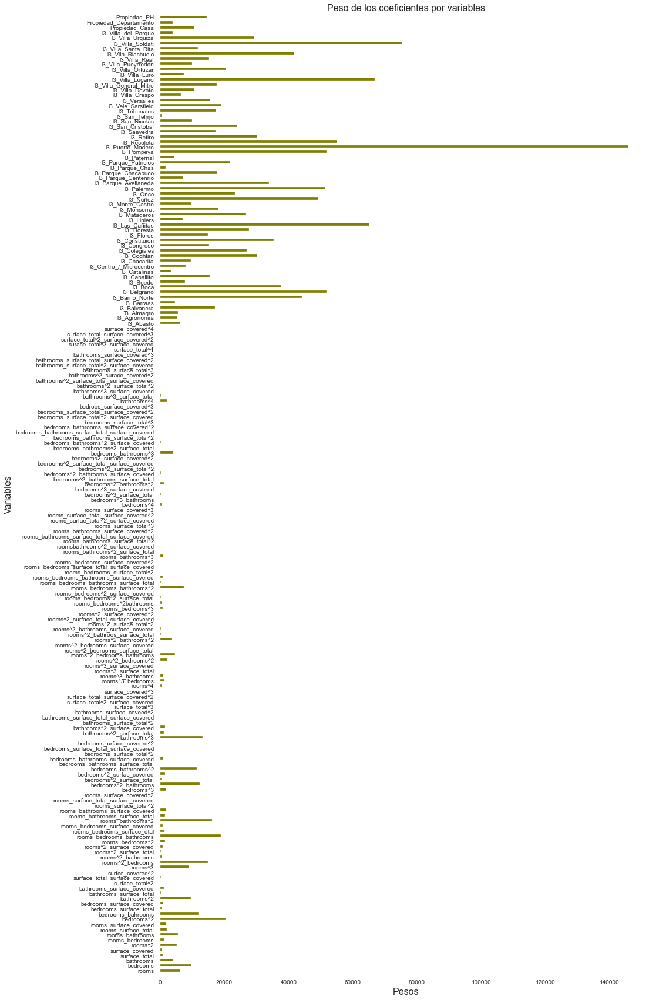

In [114]:
#Grafico los coeficientes (absolutos) y las variables
plt.figure(figsize = (15,30))
index = coef_names_gs
ax = np.abs(features_importance['Coeficientes']).plot.barh(color = 'olive')
plt.xlabel('Pesos', fontsize=16)
plt.ylabel('Variables', fontsize=16)
plt.title('Peso de los coeficientes por variables', fontsize=16)
plt.show()

Las variables mas importantes fueron: los barrios Puerto Madero, Villa Soldati, Villa Lugano y Las Cañitas. Es importante destacar que, al regularizar, los coeficientes que fueron importantes, resultaron ser nuevamente los mismos que los obtenidos en los modelos con sus parámetros por default.  

El valor de alpha optimizado por GridSearch fue 5. Los errores RMSE correspondientes al train y test, no variaron mucho, en relación al modelo sin regularización. Sin embargo, el modelo se hizo mas simple ya que se observan coeficientes penalizados en la regularización con valor de cero o cercano.

**GridSearchCV y Lasso**

El hiperparámetro parámetro a optimizar fue el valor de alpha correspondiente a Lasso. Los valores a probar, fueron los sugeridos de acuerdo a la bibliografía y los usados durante las clases. Nuevamente, si el valor sugerido por el GS, correspondía a un extremo de la lista de valores a probar, agregaba valores nuevos.

In [115]:
#Instancio el modelo
reg_lasso_gs = Lasso() 

#Defino los parámetros a usar en el GridSearchCV
parameters = {
              "alpha": [10, 5, 1, 0.5]
            }

cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
grid_2 = GridSearchCV(estimator=reg_lasso_gs, param_grid = parameters, cv = cv)

#Entreno el modelo
grid_2.fit(X_train_new_2, y_train)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=42),
             estimator=Lasso(), param_grid={'alpha': [10, 5, 1, 0.5]})

In [116]:
#Imprimo los mejores parámetros
print(grid_2.best_params_)

{'alpha': 1}


In [117]:
#Entreno el modelo con los mejores parámetros
reg_lasso_gs = Lasso(alpha = grid_2.best_params_['alpha'])
reg_lasso_gs.fit(X_train_new_2, y_train)

Lasso(alpha=1)

In [118]:
#Imprimo los coeficientes
[coef for coef in reg_lasso_gs.coef_]

[9028.150534856806,
 7295.4137299644135,
 15265.33347875128,
 1688.971055425873,
 1095.5793128843984,
 -790.1776947142371,
 -1979.2704050792322,
 -3653.142015337542,
 58.13287013953601,
 -127.28088284716527,
 3480.1385386785964,
 -1884.5817465287853,
 -12.62529392666763,
 -181.58415850613716,
 1137.4818272276298,
 134.0885986661768,
 86.25371146960582,
 -5.970806598627339,
 6.997391886733757,
 1.0032524229037756,
 675.3880840466255,
 -350.3214424437331,
 -309.9966973204893,
 -1.2810691098550577,
 -16.399693874768023,
 779.6061650847084,
 -360.18563048931543,
 -7.853505995786009,
 -25.067671359702288,
 1878.8621162000545,
 10.758818927055088,
 -29.273367330291826,
 0.07746137882836801,
 0.21697405827393368,
 0.0340708677534064,
 -363.5497729290504,
 326.52067925577165,
 0.6120619047162628,
 -32.58468503760621,
 2079.2029846479663,
 16.008400868040738,
 -49.79709643267495,
 0.5077558790843643,
 0.1271021235666281,
 0.10243041278295219,
 -1585.0266936742062,
 44.54533878632342,
 -36.59819

Raiz del error cuadrático medio en Train: 38901.70817573296
Raiz del error cuadrático medio en Test: 38658.8797270666


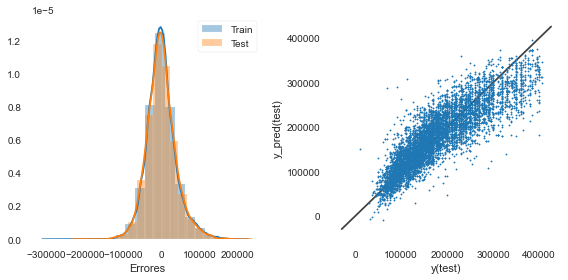

In [119]:
#Calculo los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data

evaluar_modelo (reg_lasso_gs, X_train_new_2, X_test_new_2, y_train, y_test, True)

**Importancia de las variables**

In [120]:
#Guardo los coeficientes en una lista
coef_rlp_gs = list(reg_lasso_gs.coef_.flatten())

In [121]:
#Lista con los nombres de las variables para cada coeficiente
coef_names_gs = ['rooms','bedrooms','bathrooms','surface_total','surface_covered','rooms^2','rooms_bedrooms','rooms_bathrooms',
            'rooms_surface_total','rooms_surface_covered','bedrooms^2','bedrooms_bahrooms','bedrooms_surface_total',
            'bedrooms_surface_covered','bathrooms^2','bathrooms_surface_total','bathrooms_surface_covered','surface_total^2',
            'surface_total_surface_covered','surfce_covered^2','rooms^3','rooms^2_bedrooms','rooms^2_bathrooms',
            'rooms^2_surface_total','rooms^2_surface_covered','rooms_bedrooms^2','rooms_bedrooms_bathrooms',
            'rooms_bedrooms_surface_otal','rooms_bedrooms_surface_covered','rooms_bathrooms^2','rooms_bathrooms_surface_total',
            'rooms_bathrooms_surface_covered','rooms_surface_total^2','rooms_surface_total_surface_covered','rooms_surface_covered^2',
            'bedrooms^3','bedrooms^2_bathrooms','bedrooms^2_surface_total','bedrooms^2_surfac_covered','bedrooms_bathrooms^2',
            'bedrooms_bathrooms_surface_total','bedrooms_bathrooms_surface_covered','bedrooms_surface_total^2',
            'bedrooms_surface_total_surface_covered','bedrooms_urface_covered^2','bathrooms^3','bathrooms^2_surface_total',
            'bathrooms^2_surface_covered','bathrooms_surface_total^2','bathrooms_surface_total_surface_covered',
            'bathrooms_surface_coveed^2','surface_total^3','surface_total^2_surface_covered','surface_total_surface_covered^2',
            'surface_covered^3','rooms^4','rooms^3_bedrooms','rooms^3_bathrooms','rooms^3_surface_total',
            'rooms^3_surface_covered','rooms^2_bedrooms^2','rooms^2_bedrooms_bathrooms','rooms^2_bedrooms_surface_total',
            'rooms^2_bedrooms_surface_covered','rooms^2_bathrooms^2','rooms^2_bathroos_surface_total',
            'rooms^2_bathrooms_surface_covered','rooms^2_surface_total^2','rooms^2_surface_total_surface_covered',
            'rooms^2_surface_covered^2','rooms_bedrooms^3','rooms_bedrooms^2bathrooms','rooms_bedrooms^2_surface_total',
            'rooms_bedrooms^2_surface_covered','rooms_bedrooms_bathrooms^2','rooms_bedrooms_bathrooms_surface_total',
            'rooms_bedrooms_bathrooms_surface_overed','rooms_bedrooms_surface_total^2',
            'rooms_bedrooms_surface_total_surface_covered','rooms_bedrooms_surface_covered^2','rooms_bathrooms^3',
            'rooms_bathrooms^2_surface_total','roomsbathrooms^2_surface_covered','rooms_bathrooms_surface_total^2',
            'rooms_bathrooms_surface_total_surface_covered','rooms_bathrooms_surface_covered^2','rooms_surface_total^3',
            'rooms_surfae_total^2_surface_covered','rooms_surface_total_surface_covered^2','rooms_surface_covered^3',
            'bedrooms^4','bedrooms^3_bathrooms','bedrooms^3_surface_total','bedrooms^3_surface_covered',
            'bedrooms^2_bathrooms^2','bedrooms^2_bathrooms_surface_total','bedrooms^2_bathrooms_surface_covered',
            'bedrooms^2_surface_total^2','bedrooms^2_surface_total_surface_covered','bedrooms2_surface_covered^2',
            'bedrooms_bathrooms^3','bedrooms_bathrooms^2_surface_total','bedrooms_bathrooms^2_surface_covered',
            'bedrooms_bathrooms_surface_total^2','bedrooms_bathrooms_surfac_total_surface_covered',
            'bedrooms_bathrooms_surface_covered^2','bedrooms_surface_total^3','bedrooms_surface_total^2_surface_covered',
            'bedrooms_surface_total_surface_covered^2','bedroos_surface_covered^3','bathrooms^4',
            'bathrooms^3_surface_total','bathrooms^3_surface_covered','bathrooms^2_surface_total^2',
            'bathrooms^2_surface_total_surface_covered','bathrooms^2_surace_covered^2','bathrooms_surface_total^3',
            'bathrooms_surface_total^2_surface_covered','bathrooms_surface_total_surface_covered^2',
            'bathrooms_surface_covered^3','surface_total^4','surace_total^3_surface_covered',
            'surface_total^2_surface_covered^2','surface_total_surface_covered^3','surface_covered^4','l3_Abasto',
            'l3_Agronomía','l3_Almagro','l3_Balvanera','l3_Barraas','l3_Barrio_Norte','l3_Belgrano','l3_Boca','l3_Boedo',
            'l3_Caballito','l3_Catalinas','l3_Centro_/_Microcentro','l3_Chacarita','l3_Coghlan','l3_Colegiales',
            'l3_Congreso','l3_Constituión','l3_Flores','l3_Floresta','l3_Las_Cañitas','l3_Liniers','l3_Mataderos',
            'l3_Monserrat','l3_Monte_Castro','l3_Nuñez','l3_Once','l3_Palermo','l3_Parque_Avellaneda','l3_Parque_Centenrio',
            'l3_Parque_Chacabuco','l3_Parque_Chas','l3_Parque_Patricios','l3_Paternal','l3_Pompeya','l3_Puerto_Madero',
            'l3_Recoleta','l3_Retiro','l3_Saavedra','l3_San_Cristobal','l3_San_Nicolás','l3_San_Telmo','l3_Tribunales',
            'l3_Vele_Sarsfield','l3_Versalles','l3_Villa_Crespo','l3_Villa_Devoto','l3_Villa_General_Mitre',
            'l3_Villa_Lugano','l3_Villa_Luro','l3_Villa_Ortuzar','l3_Villa_Pueyrredón','l3_Villa_Real','l3_Vila_Riachuelo',
            'l3_Villa_Santa_Rita','l3_Villa_Soldati','l3_Villa_Urquiza','l3_Villa_del_Parque','Propiedad_Casa',
            'Propiedad_Departamento','Propiedad_PH']

In [122]:
#Hago una tabla con los coeficientes y el nombre de las variables para cada coeficiente. 
#La ordeno de mayor a menor en términos absoluto
features_importance = pd.DataFrame()
index_ = coef_names_gs 
features_importance['Coeficientes'] = (coef_rlp_gs)
features_importance.index= index_
features_importance.sort_values(by=['Coeficientes'], ascending=False)

,Coeficientes
l3_Puerto_Madero,153242.684234
l3_Las_Cañitas,70680.676118
l3_Recoleta,58938.086597
l3_Belgrano,56101.226862
l3_Palermo,55807.671827
...,...
l3_Boca,-33400.588577
l3_Vila_Riachuelo,-40981.348772
l3_Pompeya,-50840.435068
l3_Villa_Lugano,-64915.747871


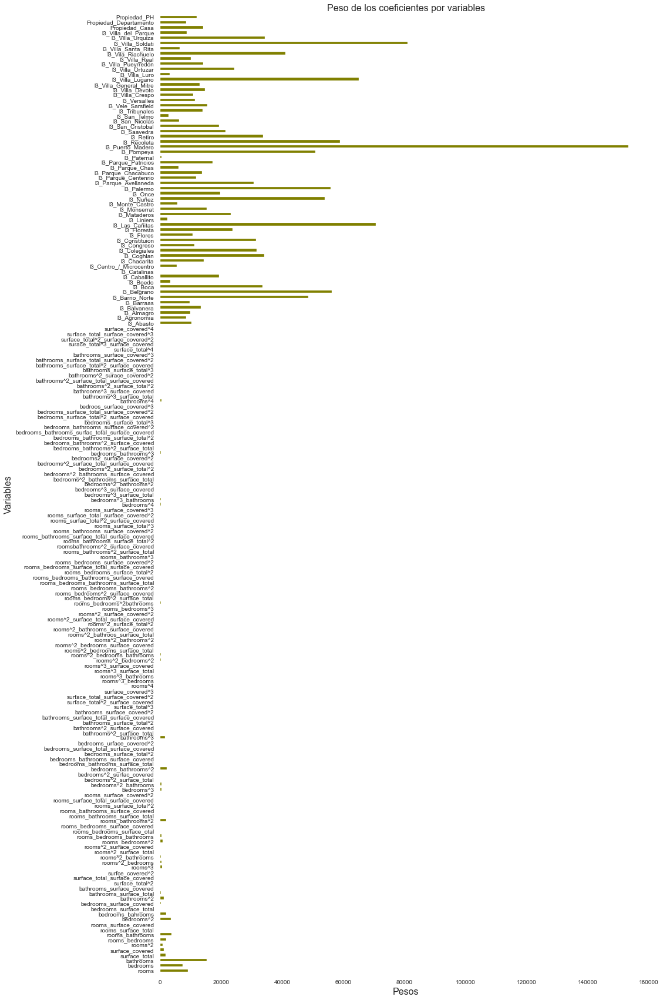

In [123]:
#Grafico los coeficientes (absolutos) y las variables
plt.figure(figsize = (15,30))
index = coef_names_gs
ax = np.abs(features_importance['Coeficientes']).plot.barh(color = 'olive')
plt.xlabel('Pesos', fontsize=16)
plt.ylabel('Variables', fontsize=16)
plt.title('Peso de los coeficientes por variables', fontsize=16)
plt.show()

Las variables con mas importancia fueron los barrios: Puerto Madero, Villa Soldati, Las Cañitas y Villa Lugano. Es importante destacar que, al regularizar, los coeficientes que fueron importantes, resultaron ser nuevamente los mismos que los obtenidos en los modelos con sus parámetros por default.  

El valor de alpha optimizado por GridSearch fue 1. Los errores RMSE correspondientes al train y test, no variaron mucho, en relación al modelo sin regularización, ni al obtenido por Ridge. Aunque, el modelo se hizo mas simple ya que se observan coeficientes penalizados en la regularización con valor de cero o cercano.

**¿Regresión lineal con caracteres polinómicos por defecto u optimizados por GridSearch?**

Comparando los modelos obtenidos con y sin optimización de hiperparámetros, se puede concluir que, sin optimizar hiperparámetros, el modelo tuvo un buen desempeño. Los errores en Train y Test fueron muy parecidos. El efecto de la regularización en el error, casi fue imperceptible, ya que, como dije, el modelo resultó tener muy buen desempeño. 

Al optimizar hiperparámetros por medio de GridSearch, el mejor grado polinómico resultó ser 4. Los errores tanto en Train como en Test disminuyeron menos del 2% en relación al modelo con parámetros por default. La regularización, hizo disminuir el valor de los coeficientes, aunque los errores se mantuvieron.

Creo que opto por elegir el modelo regularizado por Ridge con hiperparámetros optimizados, ya que los errores son mínimamente menores que con Lasso.

Esta elección la tomé en base a este proyecto y de acuerdo al objetivo de minimizar los errores. Si lo tuviera que llevar a producción, tal vez elegiría el modelo por default, ya que es un modelo con muy buen desempeño y la complejización del modelo de llevarlo a grado 4 para disminuir el error en menos del 2% no lo consideraría.

**6.	Elige dos de los modelos avanzados vistos (en el caso de regresión, considera una regresión lineal con atributos polinómicos y regularización). Entrénalos y evalúalos con sus argumentos por defecto. No te olvides de hacer un train/test split y usar Validación Cruzada**

**ii. XGBoost con valores por default y cross validation**

In [124]:
#Defino el dataset
data_xgb_t = data_encoded.copy()
#Quito los espacios en los nombres de las columnas (importante para poder hacer el plot_tree) 
data_xgb_t.columns = data_xgb_t.columns.str.replace(" ", "_")
data_xgb_t.tail()
#data_xgb_t.shape

,rooms,bedrooms,price,bathrooms,surface_total,surface_covered,l3_Abasto,l3_Agronomía,l3_Almagro,l3_Balvanera,...,l3_Villa_Pueyrredón,l3_Villa_Real,l3_Villa_Riachuelo,l3_Villa_Santa_Rita,l3_Villa_Soldati,l3_Villa_Urquiza,l3_Villa_del_Parque,Propiedad_Casa,Propiedad_Departamento,Propiedad_PH
72938,2.0,1.0,170000.0,1.0,80.0,80.0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
72939,3.0,2.0,225000.0,2.0,85.0,81.0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
72940,3.0,2.0,399000.0,2.0,88.0,82.0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
72941,3.0,2.0,178000.0,1.0,84.0,84.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
72942,5.0,2.0,298000.0,2.0,114.0,95.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [125]:
#Resumen conciso del dataframe
#data_xgb_t.info()

In [126]:
#Defino la X y la y
X = data_xgb_t.iloc[:, np.r_[0,1,3:66]] #todas las variables menos 'price' 
y = data_xgb_t.iloc[:, [2]] #price

In [127]:
#Defino el train/test/split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

**NOTA:** Para desarrollar este modelo, las variables con posibilidad de escalado son superficie total y superficie cuebierta, ambas con la misma escala, por lo que no realizaré escalado.

In [128]:
# Instancio el modelo
model_xgb = XGBRegressor(objective = 'reg:squarederror')
#verbosity = 0

#Cross Validation
cv = RepeatedKFold(n_splits = 5, n_repeats = 3, random_state = 42)
cv_results = abs(cross_val_score(model_xgb, X_train, y_train, 
                 cv=cv, scoring='neg_root_mean_squared_error'))

print('El RMSE promedio y su desvío estándar es:',abs(cv_results.mean()),'±', (abs(cv_results.std())), '\n')
print('Los 15 RMSE son:', abs(cv_results))

El RMSE promedio y su desvío estándar es: 39174.58154233073 ± 348.37136024854607 

Los 15 RMSE son: [39327.5318894  39475.44683023 39599.68843334 39019.41749885
 38493.85044799 39347.9086474  38900.2408379  39788.50410225
 39161.1090623  38705.86170782 39146.51936065 38794.18008206
 39276.33367047 39567.89535964 39014.23520465]


In [129]:
#Entreno el modelo
model_xgb.fit(X_train, y_train)

XGBRegressor(objective='reg:squarederror')

Raiz del error cuadrático medio en Train: 39001.44356701473
Raiz del error cuadrático medio en Test: 38744.005758611056


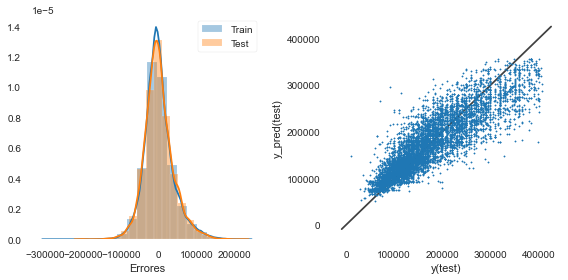

In [130]:
#Calculo los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data

evaluar_modelo (model_xgb, X_train, X_test, y_train, y_test, True)

Tras realizar el primer modelo de XGBoost con sus valores por defecto, obtengo un modelo cuyas predicciones son muy acertadas. El XGBoost, en sus parámetros por default posee el valor del parámetro reg_lambda = 1 (relacionado a la regularización por Ridge). El modelo posee muy poca difrencia entre el valor de train y test, por lo que no posee overfitting y es un modelo con buen desempeño.

In [131]:
#winsound.Beep(freq, duration)

**Importancia de los features**

En general, la importancia proporciona una puntuación que indica qué tan útil o valiosa fue cada característica en la construcción de los árboles de decisión mejorados dentro del modelo. Cuanto más se utiliza un atributo para tomar decisiones clave con árboles de decisión, mayor es su importancia relativa.

Esta importancia se calcula explícitamente para cada atributo en el conjunto de datos, lo que permite clasificar y comparar los atributos entre sí.

La importancia se calcula para un solo árbol de decisión por la cantidad en que cada punto de división de atributo mejora la medida de desempeño, ponderado por el número de observaciones de las que es responsable el nodo. La medida de rendimiento puede ser la pureza (índice de Gini) utilizada para seleccionar los puntos de división u otra función de error más específica. A continuación, se promedian las características importantes de todos los árboles de decisión dentro del modelo.

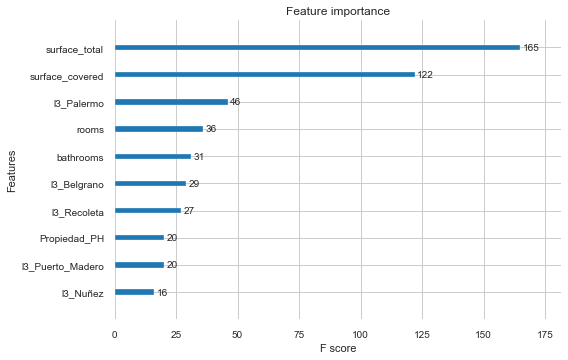

In [132]:
#Grafico la importancia de las variables
plot_importance(model_xgb, max_num_features=10) # top 10 most important features
plt.show()

Para este modelo con los hiperparámetros por default, las características mas importantes fueron: superficie total y superficie cubierta.

**Graficar algunos árboles**

Para graficar un árbol en particular, utilicé la función **plot_tree()**. En ella, el num_trees indica el árbol que se debe dibujar, no el número de árboles, así que cuando establezco el valor en dos, obtengo el segundo árbol generado por XGBoost por ejemplo.

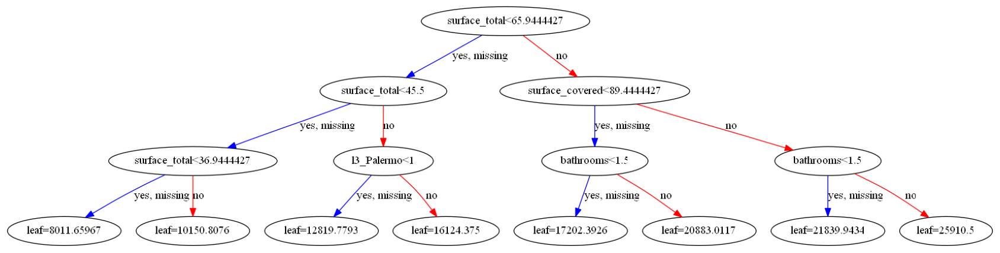

In [133]:
#Grafico el árbol 1
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb, num_trees=1, ax=ax)
plt.show()

El árbol 1, considera importantes las variables: superficie total, superficie cubierta, barrio Palermo y baños.

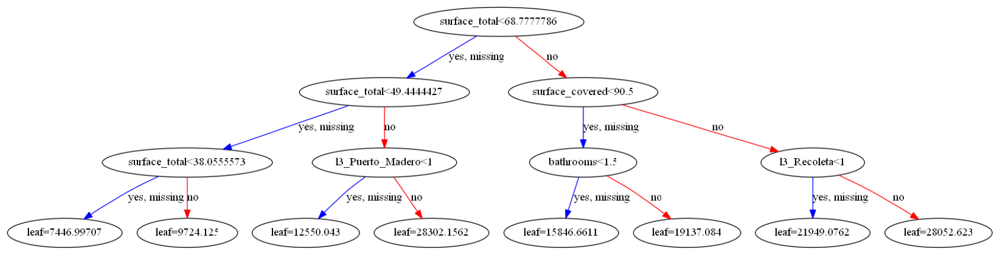

In [134]:
#Grafico el árbol 2
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb, num_trees=2,ax=ax)
plt.show()

El árbol 2, considera importantes las variables: superficie total, superficie cubierta, barrio Puerto Madero, baños y barrio Recoleta.

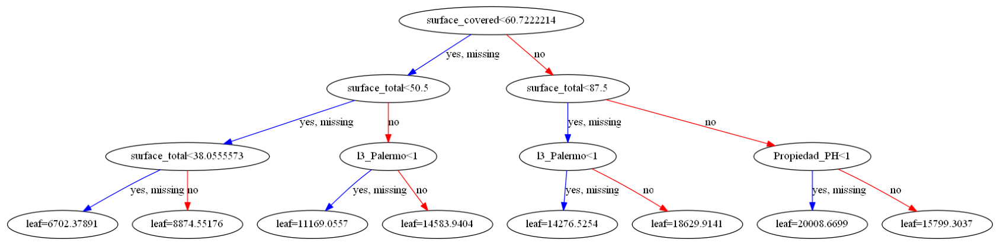

In [135]:
#Grafico el árbol 3
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb, num_trees=3,ax=ax)
plt.show()

El árbol 3, considera importantes las variables: superficie cubierta, superficie total, barrio Palermo y tipo de propiedad PH.

Al evaluar los tres árboles graficados, los tres presentaron las variables mas importantes: superficie total y superficie cubierta, pero, en cada árbol, las hojas y las variables van cambiando porque cada árbol aprende del árbol anterior.  

A continuación, haré dos modelos de XGBoost con sus parámetros optimizados.

**ii. XGBoost con cross validation y Random Search (regularización Ridge)**

In [136]:
#Defino el dataset
data_xgb_gs = data_encoded.copy()
#Quito los espacios en los nombres de las columnas (importante para poder hacer el plot_tree)
data_xgb_gs.columns = data_xgb_gs.columns.str.replace(" ", "_")
data_xgb_gs.tail()
#data_xgb_gs.shape

,rooms,bedrooms,price,bathrooms,surface_total,surface_covered,l3_Abasto,l3_Agronomía,l3_Almagro,l3_Balvanera,...,l3_Villa_Pueyrredón,l3_Villa_Real,l3_Villa_Riachuelo,l3_Villa_Santa_Rita,l3_Villa_Soldati,l3_Villa_Urquiza,l3_Villa_del_Parque,Propiedad_Casa,Propiedad_Departamento,Propiedad_PH
72938,2.0,1.0,170000.0,1.0,80.0,80.0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
72939,3.0,2.0,225000.0,2.0,85.0,81.0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
72940,3.0,2.0,399000.0,2.0,88.0,82.0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
72941,3.0,2.0,178000.0,1.0,84.0,84.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
72942,5.0,2.0,298000.0,2.0,114.0,95.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [137]:
#Resumen conciso del dataframe
#data_xgb_gs.info()

In [138]:
#Defino la X y la y
X = data_xgb_gs.iloc[:, np.r_[0,1,3:66]] #todas las variables menos 'price' 
y = data_xgb_gs.iloc[:, [2]] #price

In [139]:
#Defino el train/test/split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

**NOTA:** Para desarrollar este modelo, las variables con posibilidad de escalado son superficie total y superficie cuebierta, ambas con la misma escala, por lo que no realizaré escalado.

In [140]:
# Instancio el modelo
model_xgb_gs = XGBRegressor(objective = 'reg:squarederror')
#verbosity = 0

Entre los hiperparámetros para definir en el XGBoost (entre muchos otros), se encuentran: 


- eta (learning_rate, **default: 0.3**): reducción del tamaño del paso utilizada en la actualización para evitar el sobreajuste. Después de cada paso de impulso, podemos obtener directamente los pesos de las nuevas funciones, y eta reduce los pesos de las funciones para que el proceso de impulso sea más conservador. **Su rango es de: [0,1].**


- max_depth (**default: 6**): profundidad máxima de un árbol. Incrementar este valor hará que el modelo sea más complejo y más probable que se sobreajuste. XGBoost consume memoria de forma agresiva al entrenar un árbol profundo.

Otros hiperparámetros relacionados a la regularización de Ridge y Lasso.

- lambda (reg_lambda, **default: 1**): L2 regularización en pesos de hojas. Equivalente a la regresión de Ridge.


- alpha (reg_alpha, **default: 0**): L1 regularización en pesos de hojas. Equivalente a la regresión de Lasso.


- gamma (min_split_loss, **default: 0**): se requiere una reducción mínima de pérdidas para realizar una nueva partición en un nodo hoja del árbol. Cuanto mayor sea gamma, más conservador será el algoritmo.

**NOTA:** En un primer momento, hice grillas con mas hiperparámetros y mas cantidad de valores. Pero, el proceso se demoraba muchisimas horas (alguno que probé hasta nunca terminó), por lo que decidí utilizar los parámetros que me parecían mas importantes. También al observar la demora, decidí cambiar por el método de RandomSearch().

Los hiperparámetros que decidí testear fueron: learning rate, max_depth, gamma y alpha o lambda de acuerdo a si era regularización por Lasso o Ridge. Los valores los busqué por bibliografía y de acuerdo a los trabajados en clase.

In [141]:
#Parámetros para el RandomSearchCV (regularización con Ridge)
parameters_for_testing = {
                            'max_depth': [3,4,5],
                            'reg_lambda': [1e-2, 0.1, 1],
                            'learning_rate': [0.3, 0.5, 0.7],
                            'gamma': [0, 10, 20]

                         }
#Instancio el modelo                  
model_xgb_gs_f = RandomizedSearchCV(model_xgb_gs, parameters_for_testing, n_iter=100, 
                                    random_state=0, cv = 5, scoring='neg_root_mean_squared_error')
#Entreno el modelo
model_xgb_gs_f.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=XGBRegressor(objective='reg:squarederror'),
                   n_iter=100,
                   param_distributions={'gamma': [0, 10, 20],
                                        'learning_rate': [0.3, 0.5, 0.7],
                                        'max_depth': [3, 4, 5],
                                        'reg_lambda': [0.01, 0.1, 1]},
                   random_state=0, scoring='neg_root_mean_squared_error')

In [142]:
#Imprimo los mejores parámetros y el mejor score
print('Los mejores parámetros son:', model_xgb_gs_f.best_params_, '\n')

print('El mejor score es:', abs(model_xgb_gs_f.best_score_))

Los mejores parámetros son: {'reg_lambda': 1, 'max_depth': 5, 'learning_rate': 0.7, 'gamma': 0} 

El mejor score es: 33565.83649986313


In [143]:
#winsound.Beep(freq, duration)

Ahora entrenaré el modelo con los mejores parámetros obtenidos por Random Search. El parámetro reg_alpha lo pondré en cero, ya que utilizaré el mejor parámetro para reg_lambda (regularización de Ridge).

In [144]:
#Entreno el modelo con los mejores parámetros
model_xgb_gs = XGBRegressor(objective = 'reg:squarederror',
                            reg_alpha = 0,
                            gamma = model_xgb_gs_f.best_params_['gamma'],
                            learning_rate = model_xgb_gs_f.best_params_['learning_rate'],
                            reg_lambda = model_xgb_gs_f.best_params_['reg_lambda'],
                            max_depth = model_xgb_gs_f.best_params_['max_depth']
                            )

model_xgb_gs.fit(X_train, y_train)

XGBRegressor(learning_rate=0.7, max_depth=5, objective='reg:squarederror')

Raiz del error cuadrático medio en Train: 30682.34436691923
Raiz del error cuadrático medio en Test: 33112.23337731517


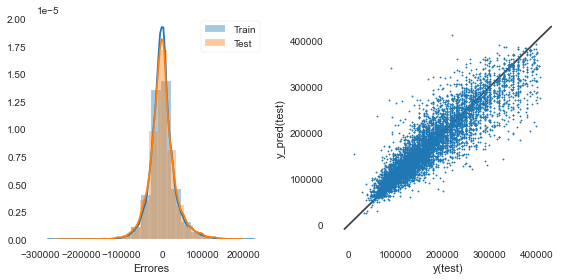

In [145]:
#Calculo los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data

evaluar_modelo (model_xgb_gs, X_train, X_test, y_train, y_test, True)

In [146]:
#winsound.Beep(freq, duration)

Se observa, que al optimizar los parámetros mediante Random Search para XGBoost (Ridge), los errores disminuyeron tanto en Train como en test. Si bien la diferencia entre Train y Test es un poco mas grande, el modelo tiene un muy buen desempeño. 

**Impotancia de las variables**

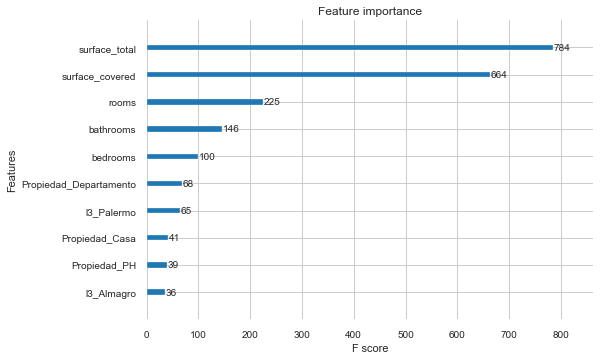

In [147]:
#Grafico la importancia de las variables
plot_importance(model_xgb_gs, max_num_features=10) # top 10 most important features
plt.show()

Para este modelo con los hiperparámetros optimizados mediante Random Search, las características mas importantes fueron: superficie total y superficie cubierta.

**Graficar algunos árboles**


Para graficar un árbol en particular, utilicé la función plot_tree(). En ella, el num_trees indica el árbol que se debe dibujar, no el número de árboles, así que cuando establezco el valor en dos, obtengo el segundo árbol generado por XGBoost por ejemplo.

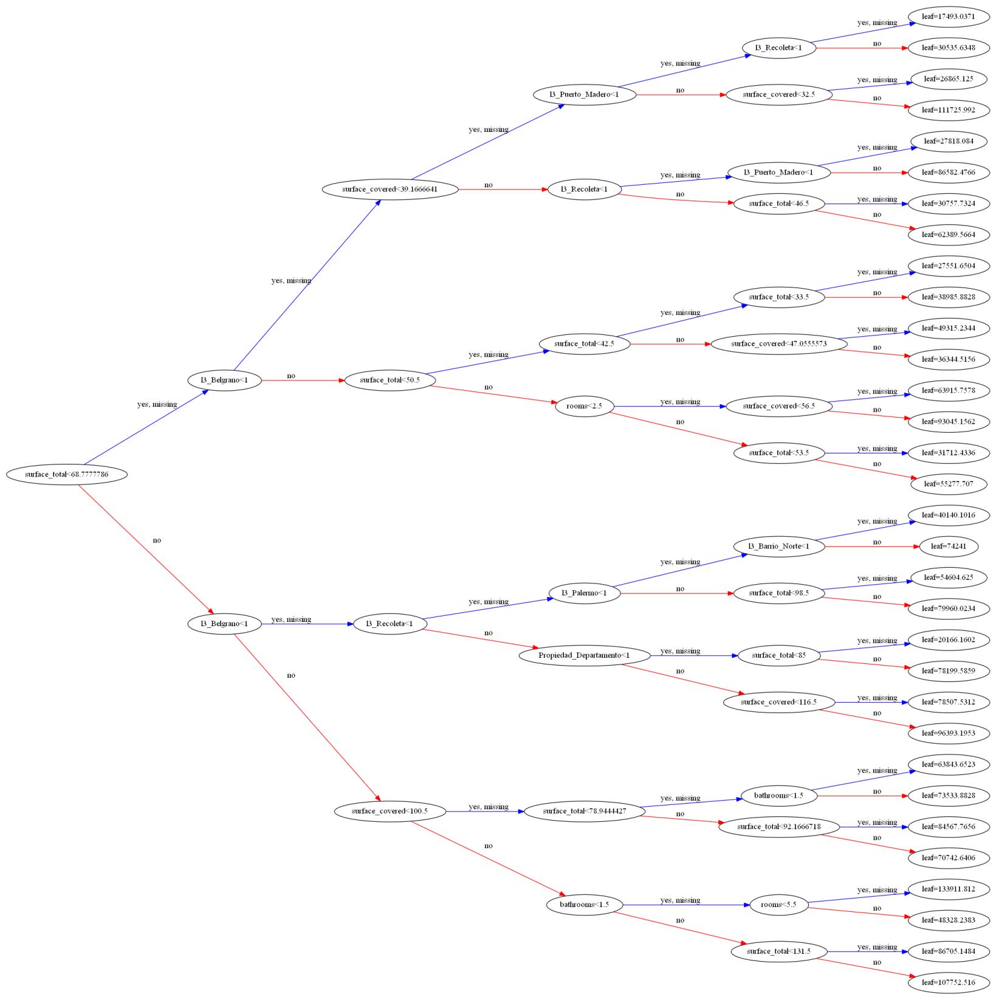

In [148]:
#Grafico el árbol 1
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb_gs, num_trees=1, ax=ax, rankdir='LR')
plt.show()

El árbol 1, considera importantes las variables: superficie total, barrio Belgrano, superficie cubierta, barrio Recoleta,  barrio Puerto Madero, ambientes, barrio Palermo, tipo de propiedad Departamento, baños y barrio Norte.

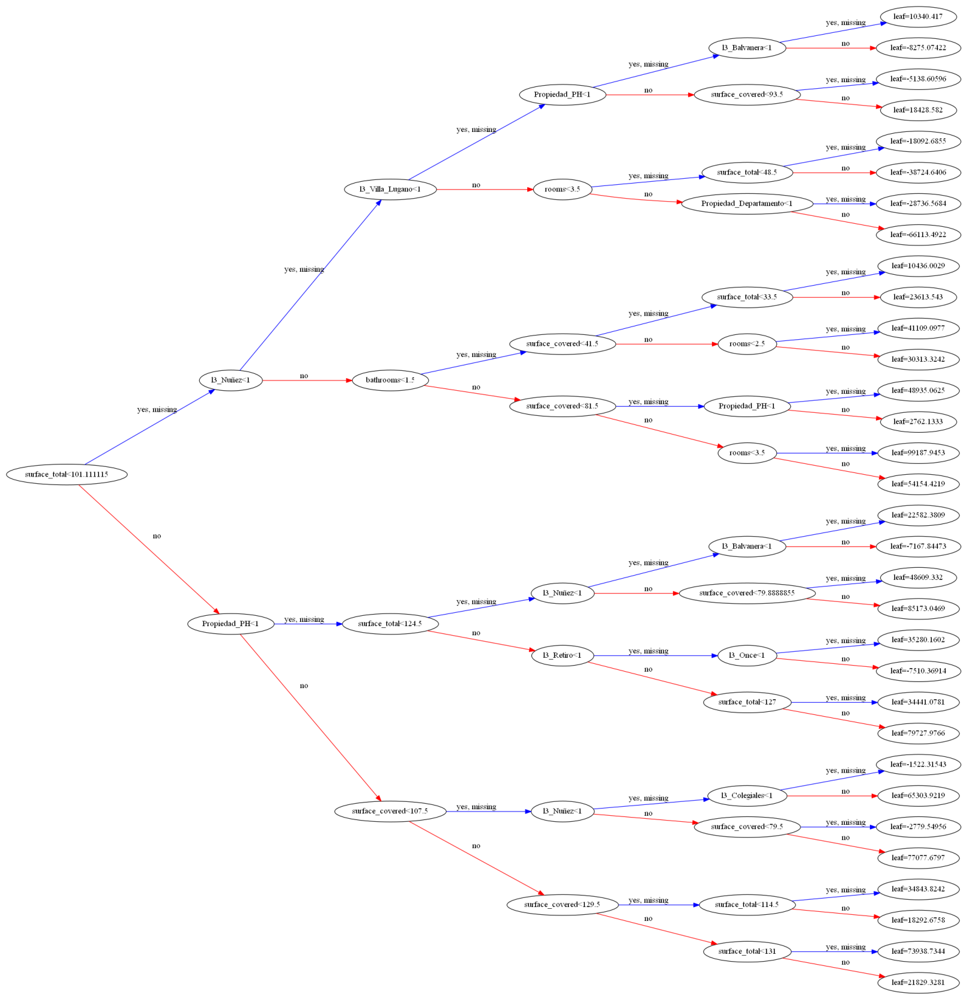

In [149]:
#Grafico el árbol 2
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb_gs, num_trees=2,ax=ax, rankdir='LR')
plt.show()

El árbol 2, considera importantes las variables: superficie total, barrio Núñez, tipo de propiedad PH, barrio Villa Lugano, baños, superficie cubierta,ambientes, barrio Retiro, barrio Balvanera, tipo de propiedad Departamento, barrio Once y barrio Colegiales.

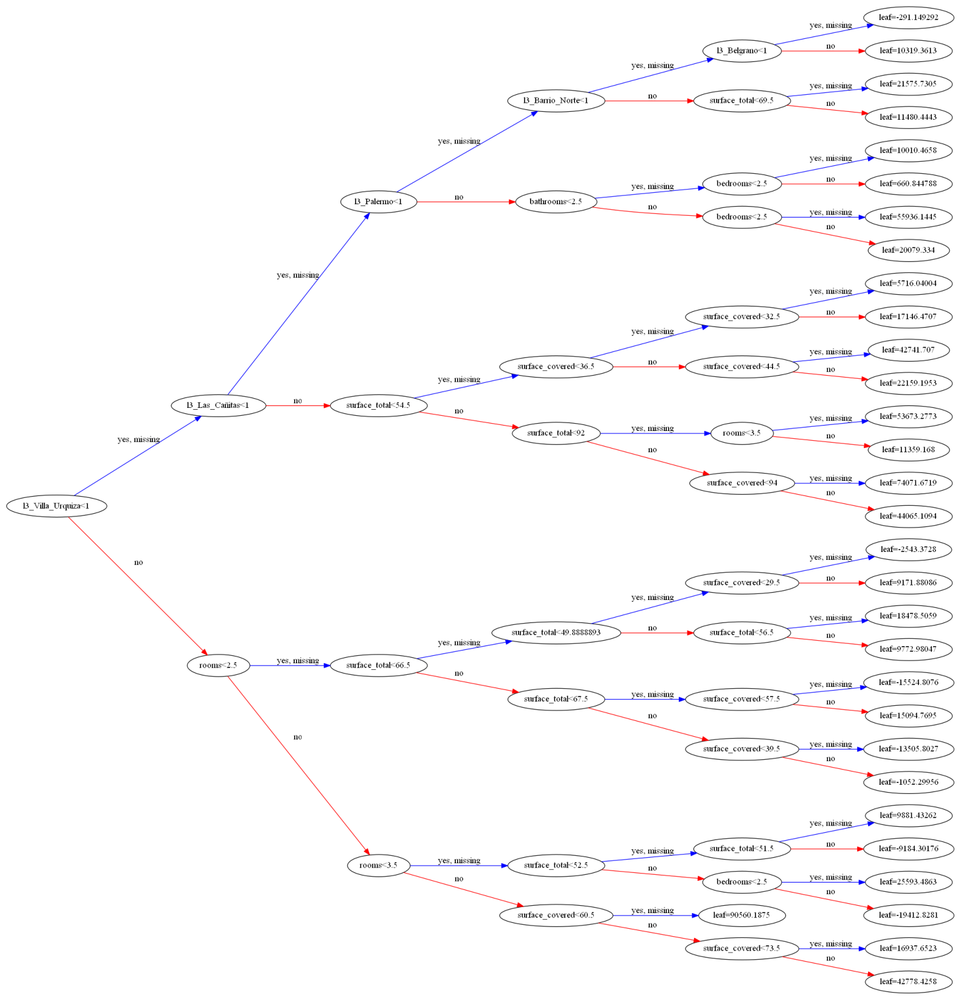

In [150]:
#Grafico el árbol 3
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb_gs, num_trees=3,ax=ax, rankdir='LR')
plt.show()

El árbol 3, considera importantes las variables: barrio Villa Urquiza, barrio las Cañitas, ambientes, barrio Palermo, superficie total, barrio Barrio Norte, baños, superficie cubierta, barrio Belgrano y habitaciones.

En cada árbol, las hojas y las variables fueron cambiando, ya que cada árbol aprende del árbol anterior.

**ii. XGBoots con cross validation y Random Search (regularización Lasso)**

In [151]:
#Defino el dataset
data_xgb_gs = data_encoded.copy()
#Quito los espacios en los nombres de las columnas (importante para poder hacer el plot_tree)
data_xgb_gs.columns = data_xgb_gs.columns.str.replace(" ", "_")
data_xgb_gs.tail()
#data_xgb_gs.shape

,rooms,bedrooms,price,bathrooms,surface_total,surface_covered,l3_Abasto,l3_Agronomía,l3_Almagro,l3_Balvanera,...,l3_Villa_Pueyrredón,l3_Villa_Real,l3_Villa_Riachuelo,l3_Villa_Santa_Rita,l3_Villa_Soldati,l3_Villa_Urquiza,l3_Villa_del_Parque,Propiedad_Casa,Propiedad_Departamento,Propiedad_PH
72938,2.0,1.0,170000.0,1.0,80.0,80.0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
72939,3.0,2.0,225000.0,2.0,85.0,81.0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
72940,3.0,2.0,399000.0,2.0,88.0,82.0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
72941,3.0,2.0,178000.0,1.0,84.0,84.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
72942,5.0,2.0,298000.0,2.0,114.0,95.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [152]:
#Resumen conciso del dataframe
#data_xgb_gs.info()

In [153]:
#Defino la X y la y
X = data_xgb_gs.iloc[:, np.r_[0,1,3:66]] #todas las variables menos 'price' 
y = data_xgb_gs.iloc[:, [2]] #price

In [154]:
#Defino el train/test/split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

**NOTA:** Para desarrollar este modelo, las variables con posibilidad de escalado son superficie total y superficie cuebierta, ambas con la misma escala, por lo que no realizaré escalado.

In [155]:
# Instancio el modelo
model_xgb_gs_2 = XGBRegressor(objective = 'reg:squarederror')
#verbosity = 0

Los hiperparámetros que decidí testear fueron: learning rate, max_depth, gamma y alpha o lambda de acuerdo a si era regularización por Lasso o Ridge. Los valores los busqué por bibliografía y de acuerdo a los trabajados en clase.

In [156]:
#Parámetros para el Random SearchCV (regularización con Ridge)
parameters_for_testing = {
                            'max_depth': [3,4,5],
                            'reg_alpha': [1e-2, 0.1, 1],
                            'learning_rate': [0.3, 0.5, 0.7],
                            'gamma': [0, 10, 20]
                         }
#Instancio el modelo                    
model_xgb_gs_f = RandomizedSearchCV(model_xgb_gs_2, parameters_for_testing, n_iter=100, 
                                    random_state=0, cv = 5, scoring='neg_root_mean_squared_error')
#Entreno el modelo
model_xgb_gs_f.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=XGBRegressor(objective='reg:squarederror'),
                   n_iter=100,
                   param_distributions={'gamma': [0, 10, 20],
                                        'learning_rate': [0.3, 0.5, 0.7],
                                        'max_depth': [3, 4, 5],
                                        'reg_alpha': [0.01, 0.1, 1]},
                   random_state=0, scoring='neg_root_mean_squared_error')

In [157]:
#Imprimo los mejores parámetros y el mejor score
print('Los mejores parámetros son:', model_xgb_gs_f.best_params_, '\n')

print('El mejor score es:', abs(model_xgb_gs_f.best_score_))

Los mejores parámetros son: {'reg_alpha': 1, 'max_depth': 5, 'learning_rate': 0.7, 'gamma': 0} 

El mejor score es: 33565.83507594856


Ahora entrenaré el modelo con los mejores parámetros obtenidos por Random Search. El parámetro reg_lambda lo pondré en cero, ya que utilizaré el mejor parámetro para reg_alpha (regularización de Lasso).

In [158]:
#Entreno el modelo con los mejores parámetros
model_xgb_gs_2 = XGBRegressor(objective = 'reg:squarederror',
                            reg_lambda = 0,
                            gamma = model_xgb_gs_f.best_params_['gamma'],
                            reg_alpha = model_xgb_gs_f.best_params_['reg_alpha'],
                            learning_rate = model_xgb_gs_f.best_params_['learning_rate'],
                            max_depth = model_xgb_gs_f.best_params_['max_depth'])

model_xgb_gs_2.fit(X_train, y_train)

XGBRegressor(learning_rate=0.7, max_depth=5, objective='reg:squarederror',
             reg_alpha=1, reg_lambda=0)

Raiz del error cuadrático medio en Train: 30531.46838153188
Raiz del error cuadrático medio en Test: 33424.76904286296


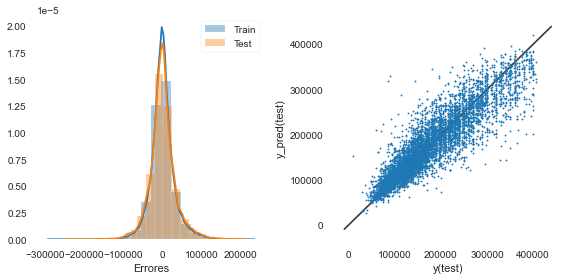

In [159]:
#Calculo los errores 

#Grafico los valores de 'y predichos' en función de 'y real' para el test data

evaluar_modelo (model_xgb_gs_2, X_train, X_test, y_train, y_test, True)

In [160]:
#winsound.Beep(freq, duration)

Se observa, que al optimizar los parámetros mediante Random Search para XGBoost (Lasso), los errores disminuyeron tanto en Train como en test. Si bien la diferencia entre Train y Test es un poco mas grande, el modelo tiene un muy buen desempeño. 

**Impotancia de las variables**

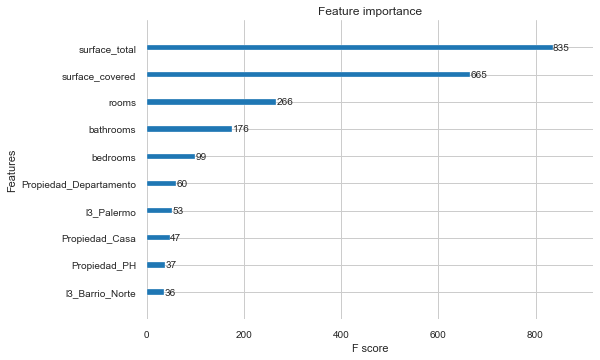

In [161]:
#Grafico la importancia de las variables
plot_importance(model_xgb_gs_2, max_num_features=10) # top 10 most important features
plt.show()

Las variables con mas importancia fueron: superficie total y superficie cubierta.

**Graficar algunos árboles**


Para graficar un árbol en particular, utilicé la función plot_tree(). En ella, el num_trees indica el árbol que se debe dibujar, no el número de árboles, así que cuando establezco el valor en dos, obtengo el segundo árbol generado por XGBoost por ejemplo.

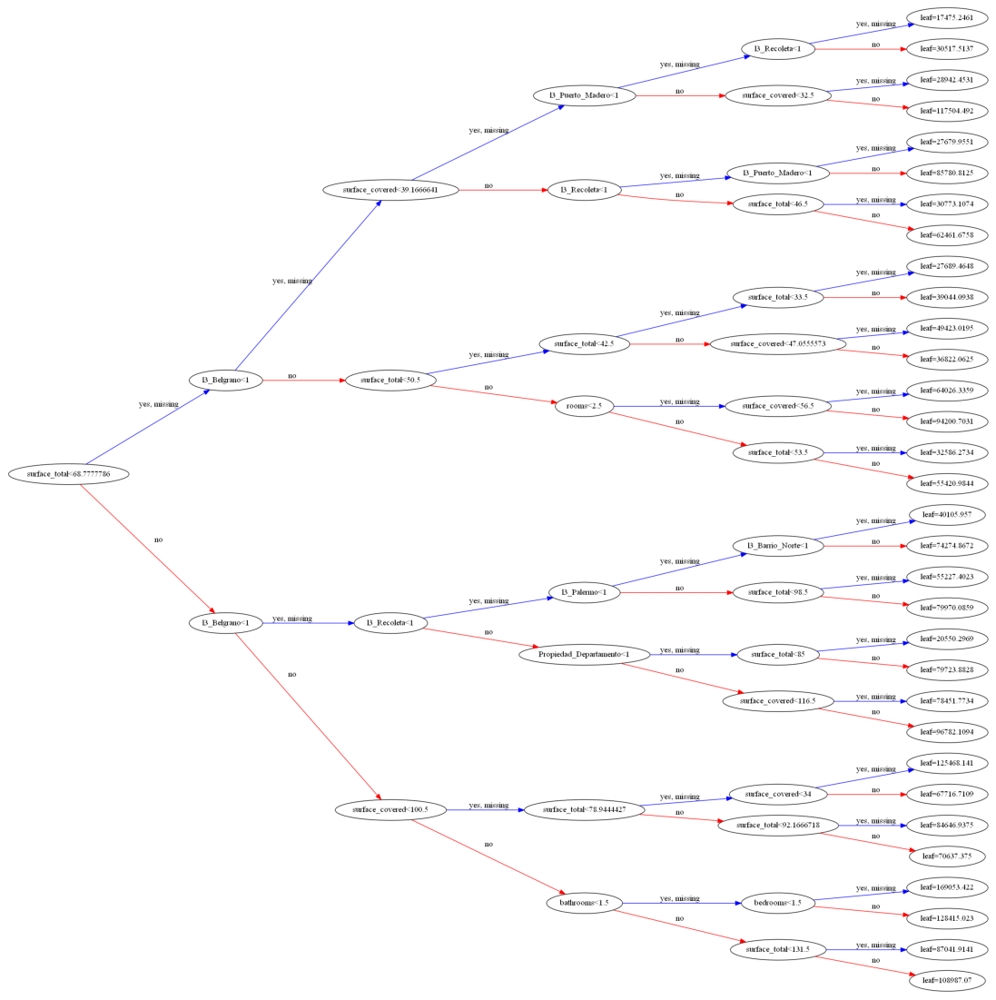

In [162]:
#Grafico el árbol 1
fig, ax = plt.subplots(figsize=(20, 20))
plot_tree(model_xgb_gs_2, num_trees=1, ax=ax, rankdir='LR')
plt.show()

El árbol 1, considera importantes las variables: superficie total, barrio Belgrano, superficie cubierta, barrio Recoleta, barrio Puerto Madero, ambientes, barrio Palermo, tipo de propiedad Departamento, baños y barrio barrio Norte. 

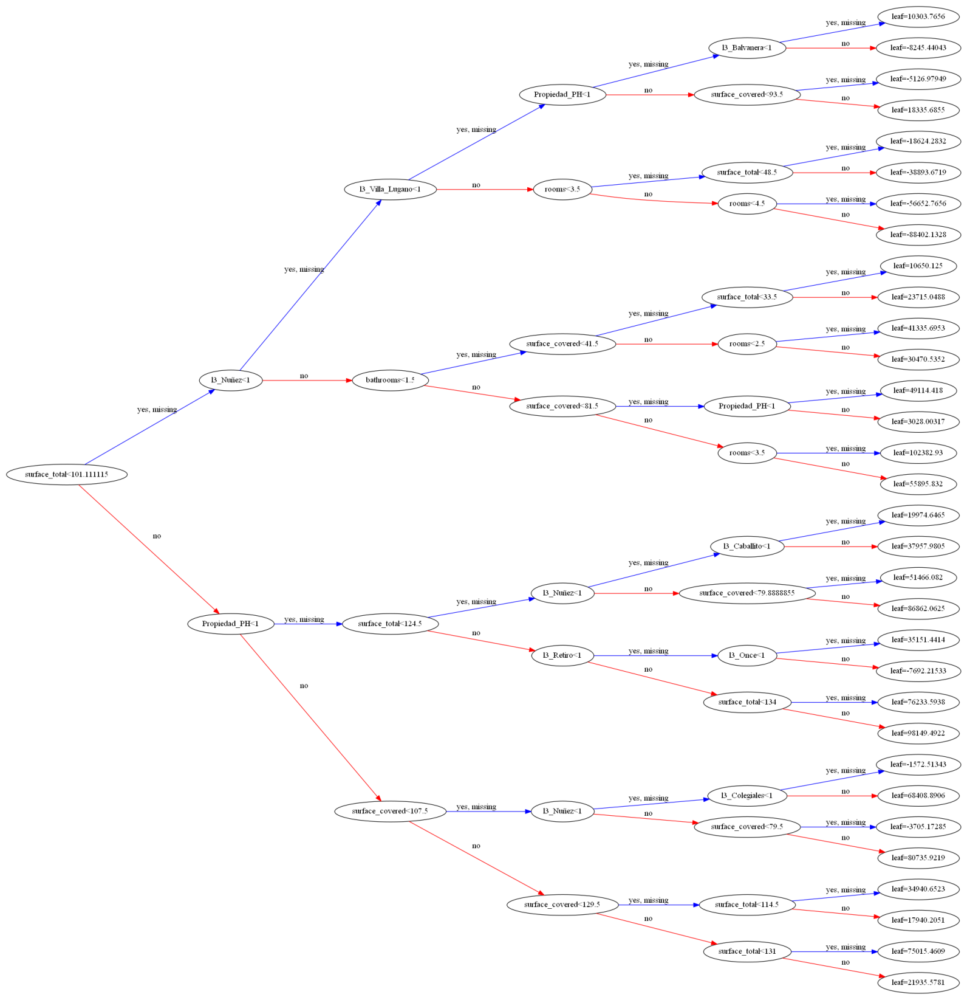

In [163]:
#Grafico el árbol 2
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb_gs_2, num_trees=2,ax=ax, rankdir='LR')
plt.show()

El árbol 2, considera importantes las variables: superficie total, barrio Núñez, tipo de propiedad PH, barrio Villa Lugano, baños, superficie cubierta, ambientes, barrio Retiro, barrio Balvanera, barrio Caballito, barrio Once y barrio Coleagiales.

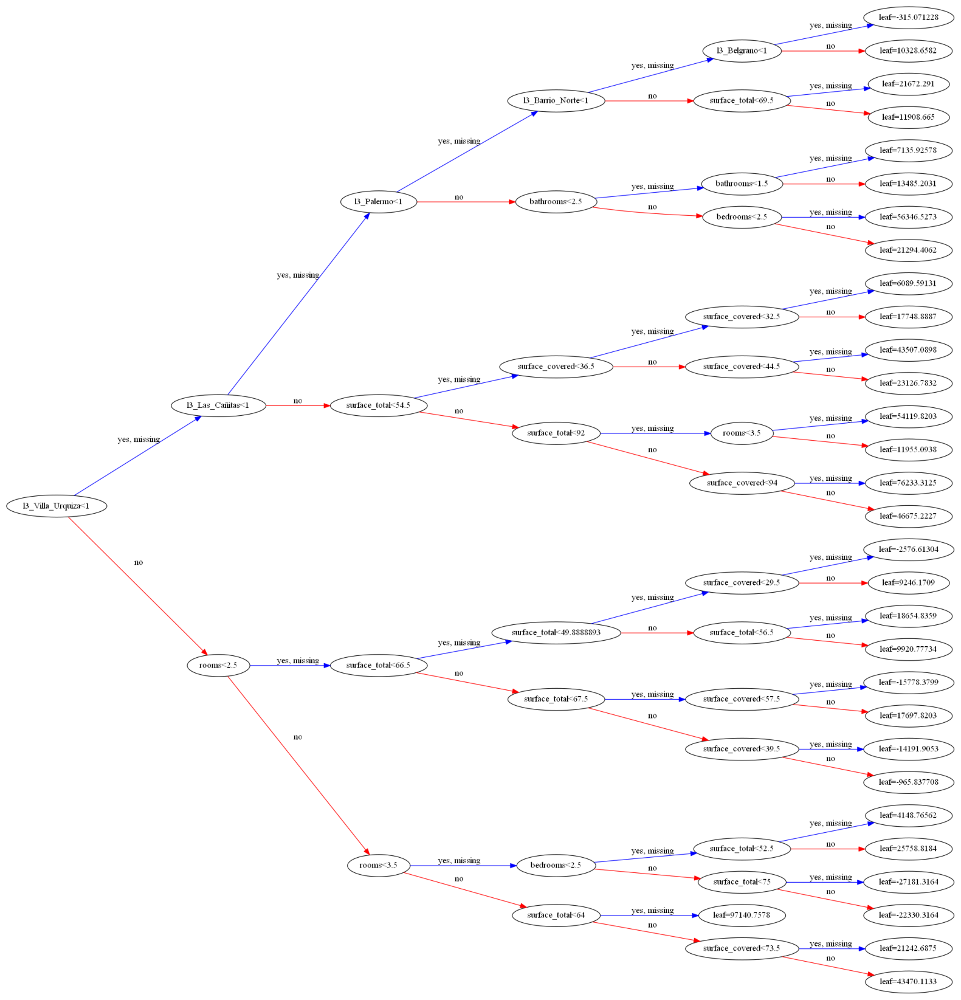

In [164]:
#Grafico el árbol 3
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb_gs_2, num_trees=3,ax=ax, rankdir='LR')
plt.show()

El árbol 3, considera importantes las variables: barrio Villa Urquiza, barrio Las Cañitas, ambientes, barrio Palermo, superficie total, barrio Barrio Norte, baños, superficie cubierta, habitaciones y barrio Belgrano.

En cada árbol, las hojas y las variables fueron cambiando, ya que cada árbol aprende del árbol anterior.

**¿XGBoost por defecto u optimizado por Random Search?** 

Al comparar los modelos obtenidos usando XGBoost con sus parámetros por default y optimizados por RandomSearch, se obtienen modelos en los que el RMSE ha disminuído tanto en el set de entrenamiento, como en el de testeo.

La reducción del RMSE en el set de testeo para el caso de XGBoost (Ridge), respecto al XGBoost con sus parámetros por default fue del 14.5% . La reducción con Lasso fue aproximadamente la misma. 

Si bien, se observa que la diferencia en el RMSE entre Train y Test ha aumentado, pero desde mi punto de vista, el modelo sigue con muy buen desempeño.

Entre los modelos de XGBoost, elegiría el de parámetros optimizados y regularizado por Ridge, ya que posee mejores errores para el Test (además, con Lasso, la demora computacional es mucho mayor).

**8.	Compara el desempeño de los nuevos modelos entre sí y con el modelo de la Parte A. ¿Cuál elegirías? Justifica.**

Al comparar el desempeño de ambos modelos avanzados, si utilizamos sus valores por defecto, tanto la regresión lineal con caracteres polinómicos como el XGBoost muestran el mismo desempeño. Sus errores son casi iguales y sus diferencias en los errores entre Train y Test, son también muy parecidos.

Pero al optimizar los hiperparámetros en ambos modelos avanzados, XGBoost mostró una reducción mucho mayor del RMSE tanto en Train como en Test. Además la diferencia entre Train y Test es pequeña evidenciado la no existencia de overfitting. 

Al comparar **entre sí todos los modelos nuevos obtenidos**, el elegido es el XGBoost con sus parámetros optimizados por Grid Search y regularizado con Ridge, ya que resultó en un modelo con muy buen desempeño. Sus errores son los menores y además la diferencia entre Train y Test es pequeña evidenciado la no existencia de overfitting. 

Al comparar **los mejores modelos nuevos y el modelo obtenido en la parte A**:

- Modelo parte A:

Raiz del error cuadrático medio en Train: 34891.29522276065

Raiz del error cuadrático medio en Test: 43184.72636533376

- Mejor modelo Regresión lineal con caracteres polinómicos: optimizados por Grid Search y regularización por Ridge.

Raíz del error cuadrático medio en Train: 38574.975916368574

Raíz del error cuadrático medio en Test: 38442.89447465973

- Mejor modelo XGBoost: optimizado por Random Search y regularizado por Ridge.

Raíz del error cuadrático medio en Train: 30682.34436691923

Raíz del error cuadrático medio en Test: 33112.23337731517

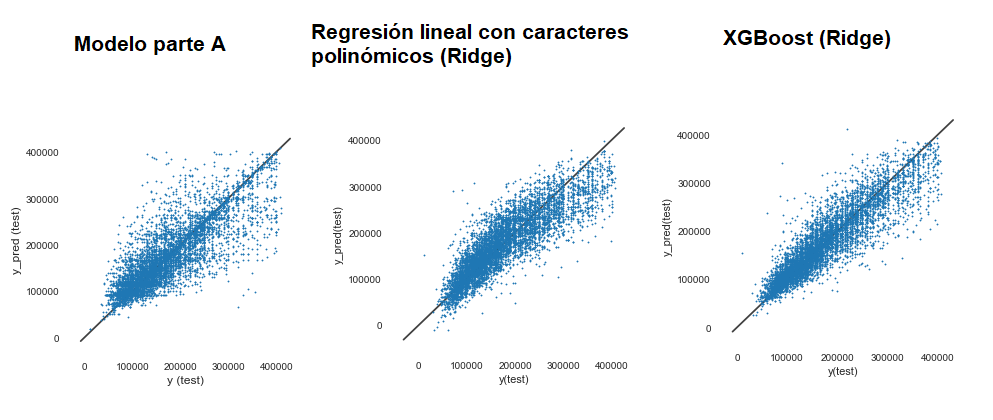

En el modelo de la parte A, se observa un modelo con overfitting.

Los modelos avanzados propuestos, mejoran claramente este overfitting y los errores no son muy elevados.

En los gráficos de los `y predichos del test`en función de los `y test reales` se puede ver, como en el modelo de la parte A hay una gran dispersión, mientras que esta dispersión de los puntos se reduce en los modelos avanzados, indicando mejor desempeño en la predicción.

**Mi modelo elegido, es el XGBoost regularizado por Ridge**. Este modelo, mejora los errores respecto a la parte A y al modelo de Regresión lineal con caracteres polinómicos regularizado por Ridge. Además, el desempeño tanto en Train como en test es muy bueno.

En todos los modelos, aun en los avanzados, se observa que el desempeño es mejor a valores bajos de precios (puntos mas concentrados y alrededor de la recta), mientras que a valores altos el desempeño disminuye (puntos mas dispersos). Esto lo retomaré en la pregunta 10.

# PARTE C - Interpretación de modelos
**De acuerdo a lo que el modelo permite, responde algunas o todas las siguientes preguntas:**

**9.	¿Qué variables fueron relevantes para el modelo para hacer una predicción? ¿Cuáles no? Si usaste una regresión lineal con regularización, presta atención a los parámetros (pendientes) obtenidas. Si usaste un modelo de ensamble en árboles, además de ver la importancia de cada atributo, también elige algunos árboles al azar y observa qué atributos considera importantes. ¿En qué se diferencian esos árboles? ¿Por qué? Finalmente, responde, ¿coincide con lo que esperabas a partir de tu experiencia con este dataset?**

En la parte 6 y 7, realicé los gráficos correspondientes a la importancia de los atributos tanto para los modelos de regresión como para el XGBoost. Además, para este último obtuve 3 árboles para cada modelo. 

Acá traeré la importancia de los atributos y los árboles del mejor modelo que elegí: **XGBoost optimizado por RandomSearch y regularizado por Ridge**.

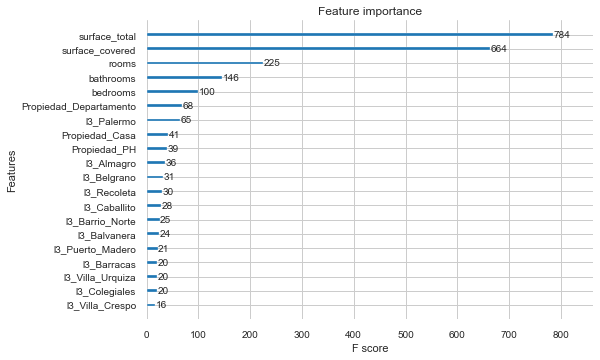

In [165]:
#Importancia de las variables
plot_importance(model_xgb_gs, max_num_features=20) # top 20 most important features
plt.show()

Las variables con mas importancia fueron: superficie total y superficie cubierta. Las tres siguientes fueron: ambientes, baños y habitaciones.
Considera menos importantes las variables relacionadas a barrios y tipo de propiedad.

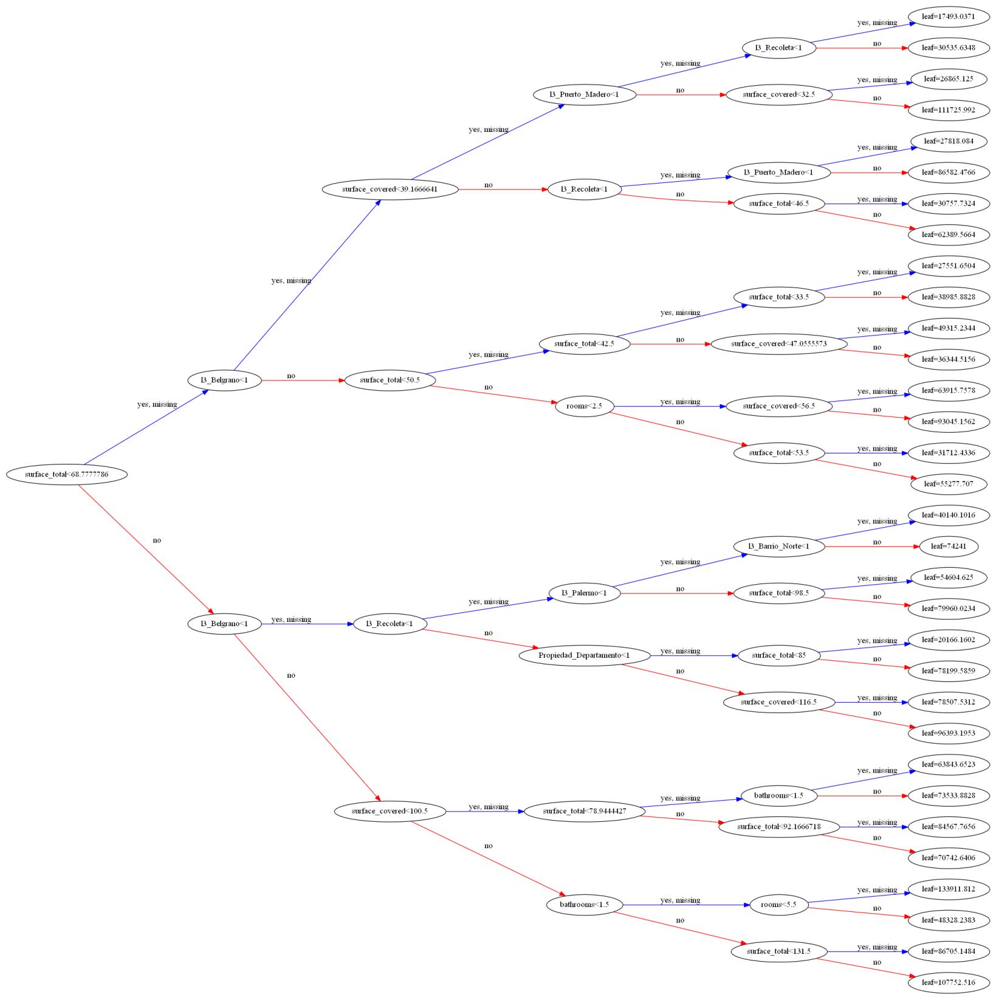

In [166]:
#Grafico el árbol 1
fig, ax = plt.subplots(figsize=(30,30))
plot_tree(model_xgb_gs, num_trees=1, ax=ax, rankdir='LR')
plt.show()

El árbol 1, considera importantes las variables: superficie total, barrio Belgrano, superficie cubierta, barrio Recoleta,  barrio Puerto Madero, ambientes, barrio Palermo, tipo de propiedad Departamento, baños y barrio Norte.

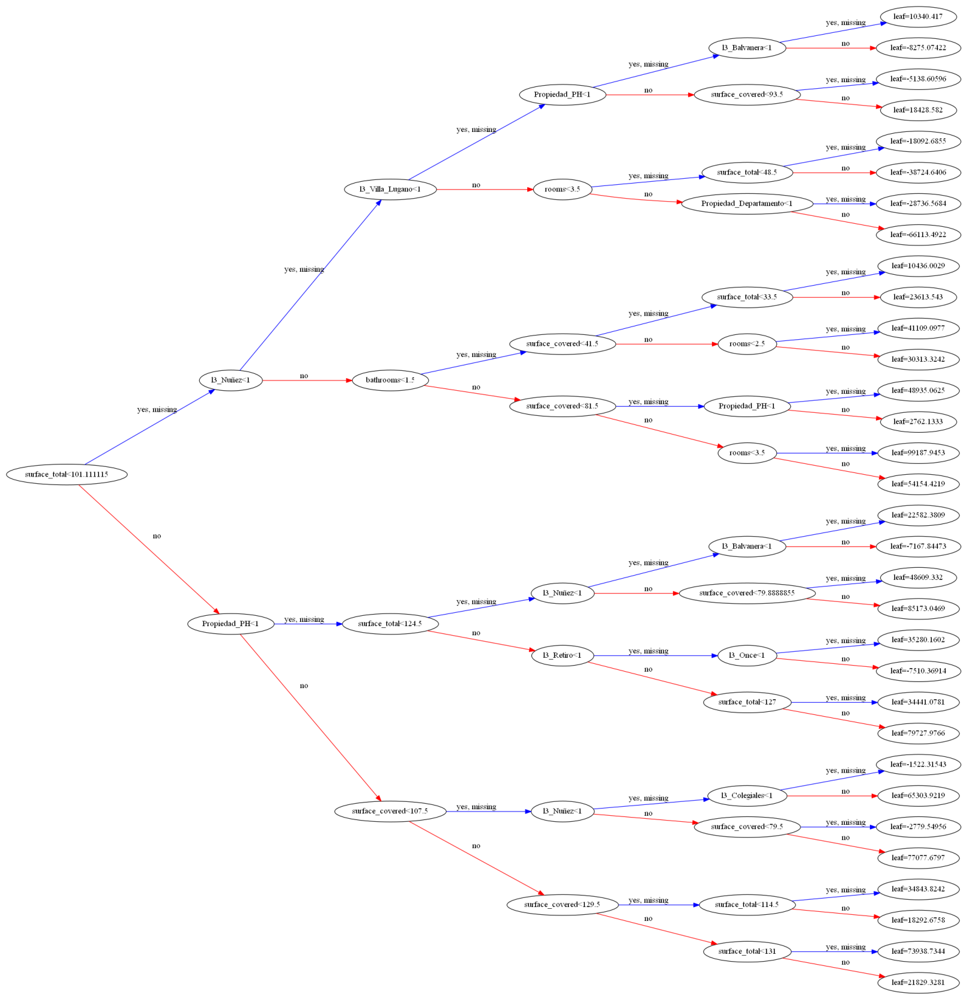

In [167]:
#Grafico el árbol 2
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb_gs, num_trees=2,ax=ax, rankdir='LR')
plt.show()

El árbol 2, considera importantes las variables: superficie total, barrio Núñez, tipo de propiedad PH, barrio Villa Lugano, baños, superficie cubierta, ambientes, ambientes, barrio Retiro, barrio Balvanera, tipo de propiedad Departamento, barrio Once y barrio Colegiales.

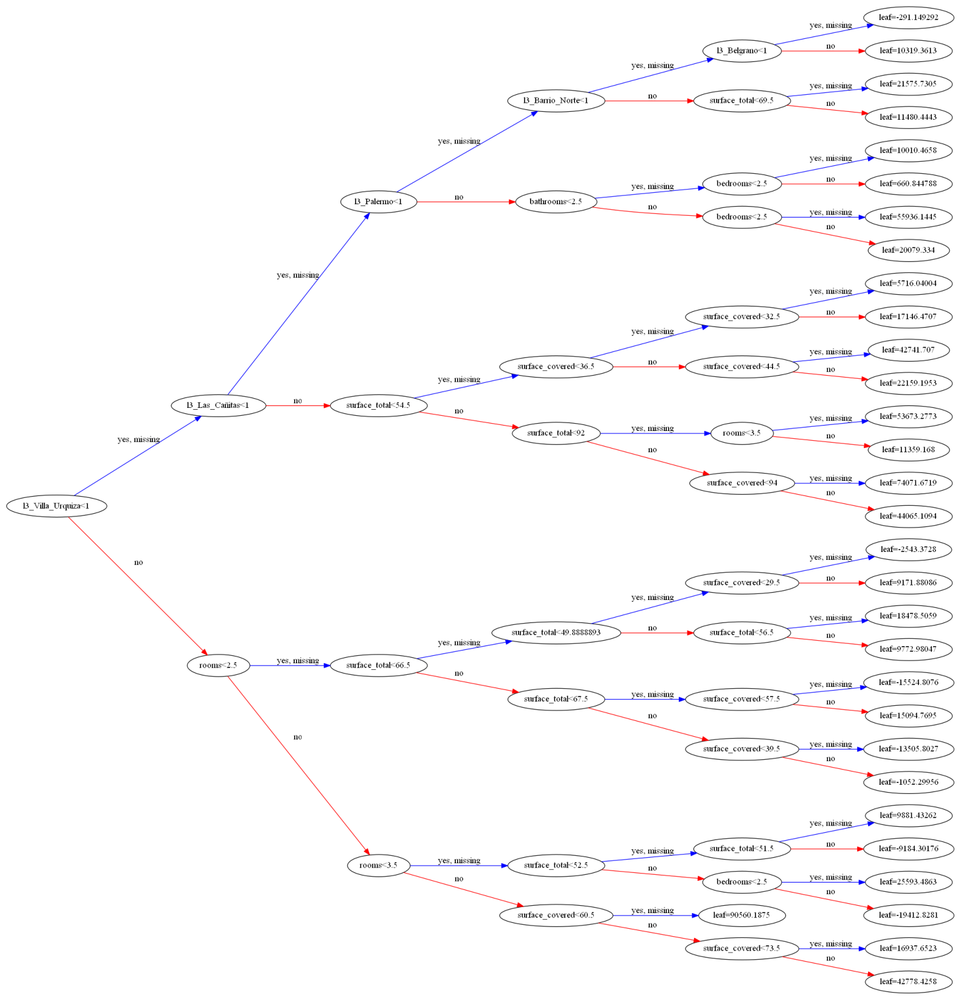

In [168]:
#Grafico el árbol 3
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(model_xgb_gs, num_trees=3,ax=ax, rankdir='LR')
plt.show()

El árbol 3, considera importantes las variables: barrio Villa Urquiza, barrio las Cañitas, ambientes, barrio Palermo, superficie total, barrio Barrio Norte, baños, superficie cubierta, barrio Belgrano y habitaciones.

El XGboost (Extra Gradient boosting) parte de árbol de decisiones que se usa para clasificar o pronosticar sobre una variable objetivo `y`, a través, del aprendizaje automático que se realiza sobre un set de datos, utilizando varios regresores débiles que en este caso, son los árboles de decisiones, pero potenciando los resultados de estos, debido al procesamiento secuencial de la data con una función de pérdida o coste, la cual, minimiza el error iteración tras iteración, haciéndolo de esta manera, un pronosticador fuerte.

Los árboles se diferencian en las variables que consideran importantes. Se puede destacar que, si bien van variando la ubicación de las mismas de árbol en árbol, las variables consideradas se van repitiendo. La variación de la importancia de estas variables de árbol en árbol, se debe a que, en el proceso de 'boosting' cada árbol va aprendiendo del árbol obtenido anterior.

Las variables que resultaron importantes para el modelo, son las que esperaba, ya que fueron las que siempre estuvieron mas relacionadas a precio: superficie cubierta y superficie total, seguida por ambientes, baños y habitaciones.

**NOTA**: al evaluar las variables que resultaron importantes en los modelos de regresión con caracteres polinómicos (no elegidos como mejores modelos), las mismas fueron los barrios cuyas propiedades eran las mas caras y las mas baratas. Tal vez no eran las variables que esperaba, aunque exhibió la importancia de incorporar estas variables en los modelos.

**10.	¿Cómo es la distribución de errores (regresión) o qué clases se confunden entre sí (clasificación)? ¿Dónde falla? ¿A qué se debe?**


En cuanto a la distribución de los errores, en todos los modelos esta fue normal, como se puede apreciar en cada histograma. Al observar los gráficos de dispersión, como ya adelanté en la pregunta 8, el desempeño en la predicción de los precios es inversamente proporcional al valor de la variable objetivo. Esto es: a menor los precios, las predicciones tienen mayor desempeño. Esto se puede observar, en los gráficos de dispersión de los `y predichos (test)`en función de los `y real`. A menor precio, la dispersión de los puntos es menor, mientras que a mayor precio, la dispersión de los puntos es mayor. Por esto, el modelo falla mas en predecir, cuando los precios de las propiedades son altos. Para mejorar esta situación, se podría dividir el dataset en dos: precios bajos y altos, y hacer dos modelos por separado para predecir de manera independiente los precios altos y los precios bajos de las propiedades. Esto podría ser el punto de partida para una mejora en la metodología, y luego evaluar si es necesario hacer otra partición tal vez. 